# process the datasets

In [2]:
import os
import shutil
from pathlib import Path
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
import matplotlib.patches as patches
import random

## Filtrer selon ce quon veut

In [3]:
# =======================
# UI de tri AVANT préprocessing (dans ../datasets), compatible splits (train/val/valid/test)
# =======================
from pathlib import Path
from typing import Optional, List, Tuple, Dict
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Racine des datasets TÉLÉCHARGÉS (AVANT cleaning)
BASE_DIR = Path("../datasets")

# Splits pris en charge
SPLITS = ["train", "val", "valid", "test"]

# Dossiers standard dans chaque split
IMG_SUBDIR = "images"
LBL_SUBDIR = "labels"

# Extensions d'images usuelles
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


# ---------- Helpers ----------
def _list_images(root: Path) -> List[Path]:
    return sorted([p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS])

def _read_yolo_txt(lbl_path: Path) -> List[Tuple[str, List[float], str]]:
    """Lit un label YOLO .txt. Retour: [(label, coords, type)] avec type ∈ {'bbox','polygon','unknown'}."""
    out: List[Tuple[str, List[float], str]] = []
    if not lbl_path or not lbl_path.exists():
        return out
    try:
        with lbl_path.open("r", encoding="utf-8") as f:
            for line in f:
                s = line.strip()
                if not s or s.startswith("#"):
                    continue
                parts = s.split()
                lab = parts[0]
                coords: List[float] = list(map(float, parts[1:])) if len(parts) > 1 else []
                if len(coords) == 4:
                    typ = "bbox"
                elif len(coords) >= 8:
                    if len(coords) % 2 == 1:
                        coords = coords[:-1]
                    typ = "polygon" if len(coords) >= 8 and len(coords) % 2 == 0 else "unknown"
                else:
                    typ = "unknown"
                out.append((lab, coords, typ))
    except Exception as e:
        print(f"⚠️ Lecture label échouée: {lbl_path} ({e})")
    return out

def _draw_image_with_annotations(ax, img_path: Path, anns: List[Tuple[str, List[float], str]]):
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    ax.imshow(img)
    for lab, coords, typ in anns:
        if typ == "bbox" and len(coords) == 4:
            cx, cy, w, h = coords
            x = (cx - w/2) * W
            y = (cy - h/2) * H
            bw = w * W
            bh = h * H
            rect = patches.Rectangle((x, y), bw, bh, linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, max(0, y - 5), f"{lab} (AABB)", color='lime', fontsize=10,
                    bbox=dict(facecolor="black", alpha=0.5, edgecolor="none", pad=1))
        elif typ == "polygon" and len(coords) >= 8:
            xs = coords[0::2]; ys = coords[1::2]
            pts = [(xx * W, yy * H) for xx, yy in zip(xs, ys)]
            poly = patches.Polygon(pts, closed=True, edgecolor='red', linewidth=2, fill=False)
            ax.add_patch(poly)
            x0, y0 = pts[0]
            ax.text(x0, max(0, y0 - 5), f"{lab} (Poly)", color='red', fontsize=10,
                    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1))
    ax.axis('off')

def _delete_if_exists(path: Path) -> bool:
    try:
        if path and path.exists():
            path.unlink()
            return True
    except Exception as e:
        print(f"⚠️ Suppression échouée: {path} ({e})")
    return False

def _build_index_for_dataset(ds_root: Path) -> List[Dict]:
    """
    Construit la liste des items à examiner sur TOUS les splits disponibles.
    Chaque item = { 'split': str, 'img': Path, 'lbl': Path|None }
    Si le dataset N'A PAS de splits, on cherche directement ds_root/images et ds_root/labels.
    """
    items: List[Dict] = []
    found_any_split = False

    # 1) Cas avec splits
    for split in SPLITS:
        split_dir = ds_root / split
        if not split_dir.exists():
            continue
        found_any_split = True
        img_dir = split_dir / IMG_SUBDIR
        lbl_dir = split_dir / LBL_SUBDIR
        if not img_dir.exists():
            continue
        imgs = _list_images(img_dir)
        for ip in imgs:
            lp = (lbl_dir / f"{ip.stem}.txt") if lbl_dir.exists() else None
            items.append({"split": split, "img": ip, "lbl": lp})

    if found_any_split:
        return items

    # 2) Cas sans splits (fallback)
    img_dir = ds_root / IMG_SUBDIR
    lbl_dir = ds_root / LBL_SUBDIR
    if img_dir.exists():
        for ip in _list_images(img_dir):
            lp = (lbl_dir / f"{ip.stem}.txt") if lbl_dir.exists() else None
            items.append({"split": None, "img": ip, "lbl": lp})
    return items


# ---------- UI principale ----------
def launch_review_ui(dataset_name: str):
    """
    Revue manuelle AVANT preprocessing dans ../datasets/<dataset_name>.
    - Gère automatiquement les splits (train/val/valid/test) s'ils existent.
    - Bouton Garder: passe à l'image suivante.
    - Bouton Jeter: supprime le .txt associé et l'image dans LE SPLIT correspondant (ou au niveau racine si pas de split).
    """
    ds_root = BASE_DIR / dataset_name
    if not ds_root.exists():
        print(f"❌ Dataset introuvable: {ds_root}")
        return

    items = _build_index_for_dataset(ds_root)
    if not items:
        print("ℹ️ Aucune image trouvée (vérifie la structure /images et /labels dans les splits).")
        return

    # État global
    state = {
        "idx": 0,
        "kept": 0,
        "discarded": 0,
        "deleted_labels": 0,
        "deleted_images": 0,
    }

    # Widgets
    btn_keep = widgets.Button(description="✅ Garder", button_style="success")
    btn_drop = widgets.Button(description="🗑️ Jeter (supprime)", button_style="danger")
    btn_quit = widgets.Button(description="⏹️ Quitter")
    progress = widgets.HTML()
    out = widgets.Output()

    def _update_view():
        out.clear_output(wait=True)
        i = state["idx"]
        n = len(items)

        if i >= n:
            with out:
                print("🎉 Revue terminée.")
                print(f"Gardées : {state['kept']} | Jetées : {state['discarded']}")
                print(f"Labels supprimés : {state['deleted_labels']} | Images supprimées : {state['deleted_images']}")
            progress.value = (
                f"<b>Terminé</b> — gardées: {state['kept']} | jetées: {state['discarded']} | "
                f"labels supprimés: {state['deleted_labels']} | images supprimées: {state['deleted_images']}"
            )
            return

        rec = items[i]
        split = rec["split"] if rec["split"] else "(no split)"
        img_path = rec["img"]
        lbl_path = rec["lbl"]
        anns = _read_yolo_txt(lbl_path) if lbl_path and lbl_path.exists() else []

        progress.value = (
            f"<b>{dataset_name}</b> — {i+1}/{n} "
            f"| split: <b>{split}</b> "
            f"| gardées: {state['kept']} | jetées: {state['discarded']} "
            f"| del_lbl: {state['deleted_labels']} | del_img: {state['deleted_images']}"
        )

        with out:
            fig = plt.figure(figsize=(6, 6))
            ax = plt.gca()
            _draw_image_with_annotations(ax, img_path, anns)
            ax.set_title(img_path.name, fontsize=10)
            plt.show()

    def _on_keep(_):
        if state["idx"] >= len(items):
            return
        state["kept"] += 1
        state["idx"] += 1
        _update_view()

    def _on_drop(_):
        if state["idx"] >= len(items):
            return

        rec = items[state["idx"]]
        img_path: Path = rec["img"]
        lbl_path: Optional[Path] = rec["lbl"]

        # Supprimer label s'il existe
        if lbl_path and _delete_if_exists(lbl_path):
            state["deleted_labels"] += 1

        # Supprimer l'image
        if _delete_if_exists(img_path):
            state["deleted_images"] += 1

        state["discarded"] += 1

        # Nettoyer la liste (ne plus re-montrer une image supprimée)
        if not img_path.exists():
            items.pop(state["idx"])
        else:
            state["idx"] += 1

        _update_view()

    def _on_quit(_):
        out.clear_output()
        progress.value = (
            f"⏹️ Arrêté — gardées: {state['kept']} | jetées: {state['discarded']} | "
            f"labels supprimés: {state['deleted_labels']} | images supprimées: {state['deleted_images']} | "
            f"index={state['idx']}/{len(items)}"
        )

    btn_keep.on_click(_on_keep)
    btn_drop.on_click(_on_drop)
    btn_quit.on_click(_on_quit)

    controls = widgets.HBox([btn_keep, btn_drop, btn_quit])
    display(progress, controls, out)

    _update_view()

In [3]:
# Racine des datasets TÉLÉCHARGÉS (AVANT cleaning)
BASE_DIR = Path("../datasets")

# Splits pris en charge
SPLITS = ["train", "val", "valid", "test"]

# Dossiers standard dans chaque split
IMG_SUBDIR = "images"
LBL_SUBDIR = "labels"

# Extensions d'images usuelles
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

launch_review_ui("DataMatrixFridge")

HTML(value='')

Output()

## Tout rassembler dans datasets_clean, sans split

In [5]:
from pathlib import Path
import shutil

# ================== CONFIG ==================
SRC_ROOT = Path("../datasets")
DST_ROOT = Path("../datasets_clean")

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}
SPLITS = ["train", "val", "valid", "test"]
YAML_CANDIDATES = ["data.yaml", "data.yml", "dataset.yaml", "dataset.yml"]

# Mettre True pour un essai à blanc (ne supprime / ne copie rien)
DRY_RUN = False
# ============================================


def _log(msg: str):
    print(msg)

def _copy_with_collision_guard(src_path: Path, dst_dir: Path, split_tag: str, dry_run: bool):
    dst_path = dst_dir / src_path.name
    if dst_path.exists():
        dst_path = dst_dir / f"{split_tag}__{src_path.name}"

    if not dry_run:
        dst_dir.mkdir(parents=True, exist_ok=True)
        shutil.copy2(src_path, dst_path)

def _copy_dataset_yaml_if_any(dataset_dir: Path, out_dir: Path, base_name: str, dry_run: bool) -> bool:
    for cand in YAML_CANDIDATES:
        src_yaml = dataset_dir / cand
        if src_yaml.exists():
            dst_yaml = out_dir / "data.yaml"
            if dst_yaml.exists():
                dst_yaml = out_dir / f"data_{base_name}.yaml"
            if not dry_run:
                out_dir.mkdir(parents=True, exist_ok=True)
                shutil.copy2(src_yaml, dst_yaml)
            return True
    return False

def _safe_rmtree(path: Path, dry_run: bool):
    if path.exists():
        if dry_run:
            _log(f"🧹 DRY-RUN: supprimerait {path}")
        else:
            shutil.rmtree(path)

def _safe_mkdir(path: Path, dry_run: bool):
    if not dry_run:
        path.mkdir(parents=True, exist_ok=True)


# Assurer l'existence (ou log) de datasets_clean
_safe_mkdir(DST_ROOT, DRY_RUN)

# Itérer sur chaque dataset source
for dataset_dir in sorted(p for p in SRC_ROOT.iterdir() if p.is_dir()):
    ds_name = dataset_dir.name
    base_name = ds_name.rsplit("-", 1)[0] if "-" in ds_name else ds_name
    out_dir = DST_ROOT / base_name
    out_images = out_dir / "images"
    out_labels = out_dir / "labels"

    _log(f"\n=== {ds_name} → {out_dir} ===")

    # 💣 S'il existe déjà, on le supprime complètement
    if out_dir.exists():
        _safe_rmtree(out_dir, DRY_RUN)

    # (Re)créer la structure de sortie
    _safe_mkdir(out_images, DRY_RUN)
    _safe_mkdir(out_labels, DRY_RUN)

    # Copier le data.yaml si présent
    has_yaml = _copy_dataset_yaml_if_any(dataset_dir, out_dir, base_name, DRY_RUN)
    if not has_yaml:
        _log(f"ℹ️ Aucun data.yaml trouvé pour {ds_name}")

    n_img, n_lab = 0, 0
    found_any_split = False

    # Parcourir les splits
    for split in SPLITS:
        split_dir = dataset_dir / split
        if not split_dir.exists():
            continue
        found_any_split = True

        img_dir = split_dir / "images"
        lab_dir = split_dir / "labels"

        if img_dir.exists():
            for f in img_dir.rglob("*"):
                if f.is_file() and f.suffix.lower() in IMG_EXTS:
                    n_img += 1
                    if not DRY_RUN:
                        _copy_with_collision_guard(f, out_images, split, DRY_RUN)

        if lab_dir.exists():
            for f in lab_dir.rglob("*"):
                if f.is_file():
                    n_lab += 1
                    if not DRY_RUN:
                        _copy_with_collision_guard(f, out_labels, split, DRY_RUN)

    # Fallback si pas de splits
    if not found_any_split:
        img_dir = dataset_dir / "images"
        lab_dir = dataset_dir / "labels"

        if img_dir.exists():
            for f in img_dir.rglob("*"):
                if f.is_file() and f.suffix.lower() in IMG_EXTS:
                    n_img += 1
                    if not DRY_RUN:
                        _copy_with_collision_guard(f, out_images, "root", DRY_RUN)

        if lab_dir.exists():
            for f in lab_dir.rglob("*"):
                if f.is_file():
                    n_lab += 1
                    if not DRY_RUN:
                        _copy_with_collision_guard(f, out_labels, "root", DRY_RUN)

    # Résumé
    _log(f"📊 Résumé: {n_img} images | {n_lab} labels")
    _log(f"✅ {'(DRY-RUN) ' if DRY_RUN else ''}Fusion terminée pour {ds_name}")


=== 20240517-xoyao → ../datasets_clean/20240517 ===
📊 Résumé: 5411 images | 5411 labels
✅ Fusion terminée pour 20240517-xoyao

=== 2D_DETECTION → ../datasets_clean/2D_DETECTION ===
📊 Résumé: 872 images | 872 labels
✅ Fusion terminée pour 2D_DETECTION

=== 2dDataMatrix → ../datasets_clean/2dDataMatrix ===
📊 Résumé: 891 images | 891 labels
✅ Fusion terminée pour 2dDataMatrix

=== 2d_data_code_detect → ../datasets_clean/2d_data_code_detect ===
📊 Résumé: 199 images | 199 labels
✅ Fusion terminée pour 2d_data_code_detect

=== DM_Code_DataSet → ../datasets_clean/DM_Code_DataSet ===
📊 Résumé: 99 images | 99 labels
✅ Fusion terminée pour DM_Code_DataSet

=== DataMatrix2 → ../datasets_clean/DataMatrix2 ===
📊 Résumé: 275 images | 279 labels
✅ Fusion terminée pour DataMatrix2

=== DataMatrixFridge → ../datasets_clean/DataMatrixFridge ===
📊 Résumé: 653 images | 653 labels
✅ Fusion terminée pour DataMatrixFridge

=== DataMatrix_blur → ../datasets_clean/DataMatrix_blur ===
📊 Résumé: 227 images | 22

## Renommage avec le préfixe indiquant le datset d'origine.

In [6]:
# 🔧 Active/désactive le dry-run ici
DRY_RUN = False  # True = ne fait qu'afficher ; False = renomme réellement
ROOT = DST_ROOT
def normalize_dataset_name(ds_name: str) -> str:
    # Supprime un suffixe '-xxxxx' (5 caractères alphanum) si présent
    if re.search(r"-[A-Za-z0-9]{5}$", ds_name):
        ds_name = ds_name.rsplit("-", 1)[0]
    # Retire tous '_' et '-'
    return ds_name.replace("_", "").replace("-", "")

def is_image(p: Path) -> bool:
    return p.is_file() and p.suffix.lower() in IMG_EXTS

for ds in sorted(ROOT.iterdir()):
    if not ds.is_dir():
        continue

    base = normalize_dataset_name(ds.name)
    img_dir = ds / "images"
    lab_dir = ds / "labels"

    if not img_dir.exists() or not lab_dir.exists():
        print(f"⚠️ {ds.name}: pas de 'images' ou 'labels' → skip")
        continue

    planned = []

    # Images
    for f in img_dir.rglob("*"):
        if not is_image(f):
            continue
        if f.name.startswith(f"{base}_"):
            continue  # déjà préfixé proprement
        new_path = f.with_name(f"{base}_{f.name}")
        if new_path.exists():
            print(f"⚠️ Collision: {new_path} existe déjà → je skip ce fichier.")
            continue
        planned.append((f, new_path))

    # Labels
    for f in lab_dir.rglob("*.txt"):
        if f.name.startswith(f"{base}_"):
            continue
        new_path = f.with_name(f"{base}_{f.name}")
        if new_path.exists():
            print(f"⚠️ Collision: {new_path} existe déjà → je skip ce fichier.")
            continue
        planned.append((f, new_path))

    if not planned:
        print(f"ℹ️ {ds.name}: rien à renommer.")
        continue

    if DRY_RUN:
        print(f"🔎 DRY-RUN {ds.name} — {len(planned)} renommages prévus (aucun changement écrit) :")
        for src, dst in planned[:1]:
            print(f"  {src.name}  ->  {dst.name}")
        if len(planned) > 10:
            print(f"  ... (+{len(planned)-10} autres)")
    else:
        for src, dst in planned:
            src.rename(dst)
        print(f"✅ {ds.name}: {len(planned)} fichiers renommés avec préfixe '{base}_'")

✅ 20240517: 10822 fichiers renommés avec préfixe '20240517_'
✅ 2D_DETECTION: 1744 fichiers renommés avec préfixe '2DDETECTION_'
✅ 2dDataMatrix: 1782 fichiers renommés avec préfixe '2dDataMatrix_'
✅ 2d_data_code_detect: 398 fichiers renommés avec préfixe '2ddatacodedetect_'
✅ DM_Code_DataSet: 198 fichiers renommés avec préfixe 'DMCodeDataSet_'
ℹ️ DataMatrix: rien à renommer.
✅ DataMatrix2: 554 fichiers renommés avec préfixe 'DataMatrix2_'
✅ DataMatrixFridge: 1306 fichiers renommés avec préfixe 'DataMatrixFridge_'
✅ DataMatrix_blur: 454 fichiers renommés avec préfixe 'DataMatrixblur_'
✅ Datamatrixsteel: 162 fichiers renommés avec préfixe 'Datamatrixsteel_'
✅ Detector: 900 fichiers renommés avec préfixe 'Detector_'
✅ LiBattery DM Code Detection: 1684 fichiers renommés avec préfixe 'LiBattery DM Code Detection_'
✅ OR Code Detection: 208 fichiers renommés avec préfixe 'OR Code Detection_'
✅ asd: 2978 fichiers renommés avec préfixe 'asd_'
✅ bcdmp: 3286 fichiers renommés avec préfixe 'bcdmp_'

## Poly annotation vers aabb

✅ 20240517: polygones convertis en AABB → ../datasets_clean/20240517/labels_aabb


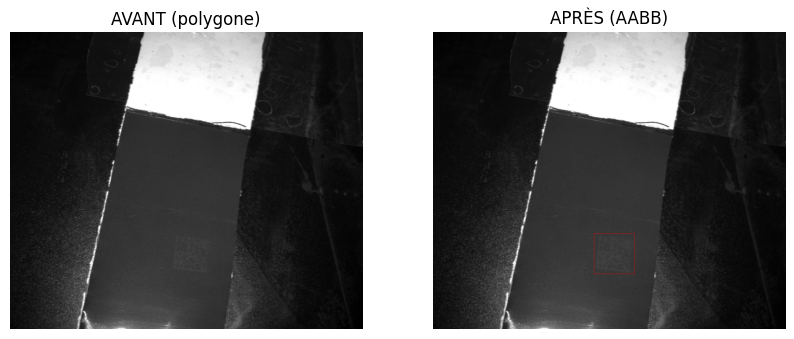

ℹ️ 2D_DETECTION: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ 2dDataMatrix: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ 2d_data_code_detect: polygones convertis en AABB → ../datasets_clean/2d_data_code_detect/labels_aabb


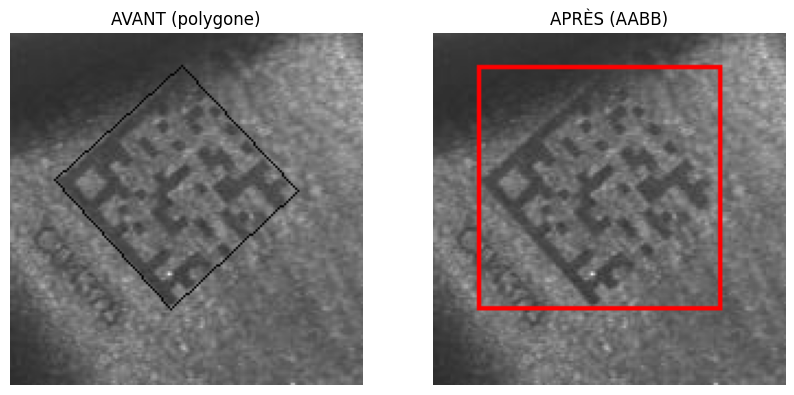

ℹ️ DM_Code_DataSet: aucun polygone trouvé, labels copiés en bbox uniquement.
⏭️  labels_aabb déjà présent pour DataMatrix, skip.
ℹ️ DataMatrix2: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ DataMatrixFridge: polygones convertis en AABB → ../datasets_clean/DataMatrixFridge/labels_aabb


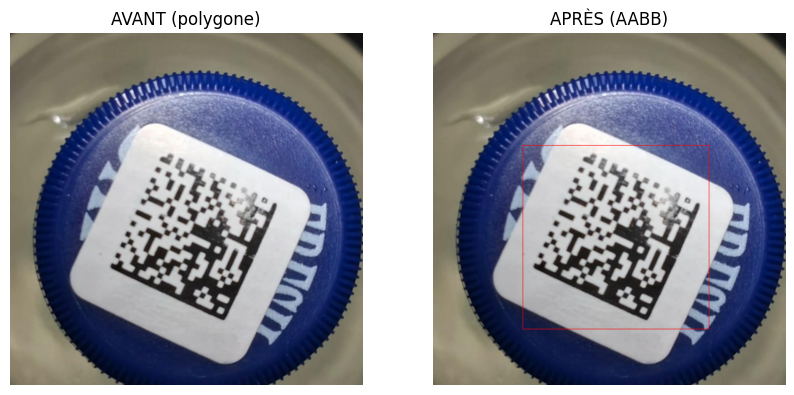

ℹ️ DataMatrix_blur: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ Datamatrixsteel: polygones convertis en AABB → ../datasets_clean/Datamatrixsteel/labels_aabb


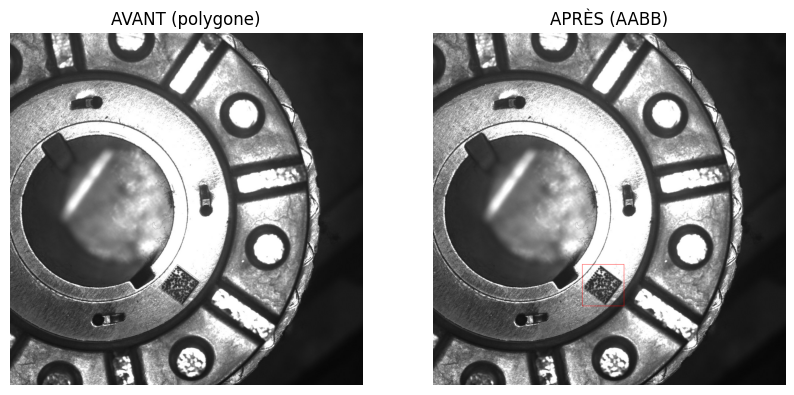

✅ Detector: polygones convertis en AABB → ../datasets_clean/Detector/labels_aabb


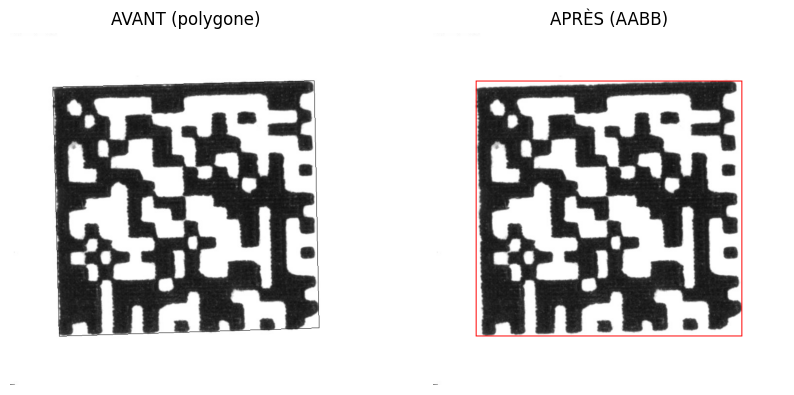

ℹ️ LiBattery DM Code Detection: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ OR Code Detection: polygones convertis en AABB → ../datasets_clean/OR Code Detection/labels_aabb


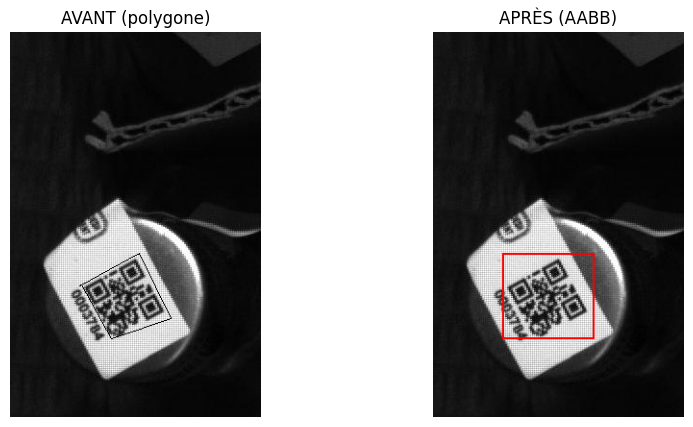

ℹ️ asd: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ bcdmp: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ data-matrix-codes: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ datamatrix_140: polygones convertis en AABB → ../datasets_clean/datamatrix_140/labels_aabb


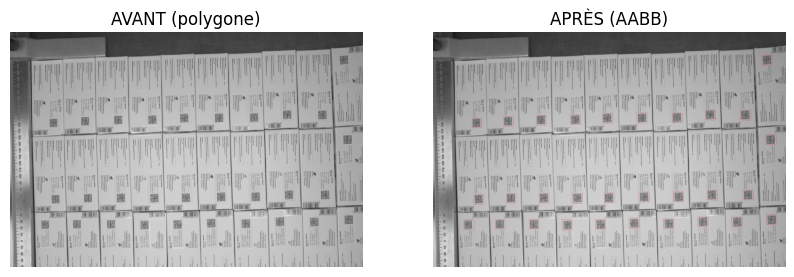

✅ datamatrixfit: polygones convertis en AABB → ../datasets_clean/datamatrixfit/labels_aabb


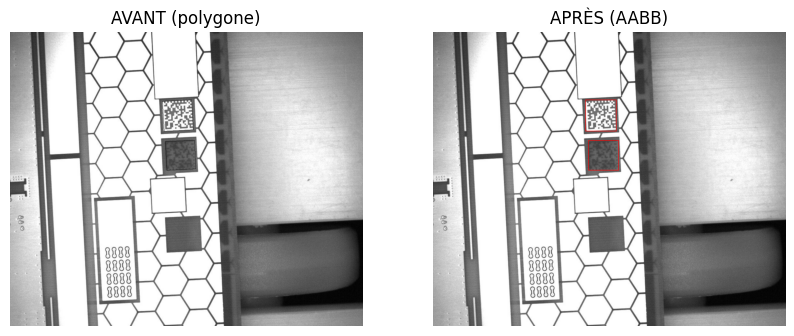

⏭️  labels_aabb déjà présent pour datamtarix, skip.
✅ diffclass: polygones convertis en AABB → ../datasets_clean/diffclass/labels_aabb


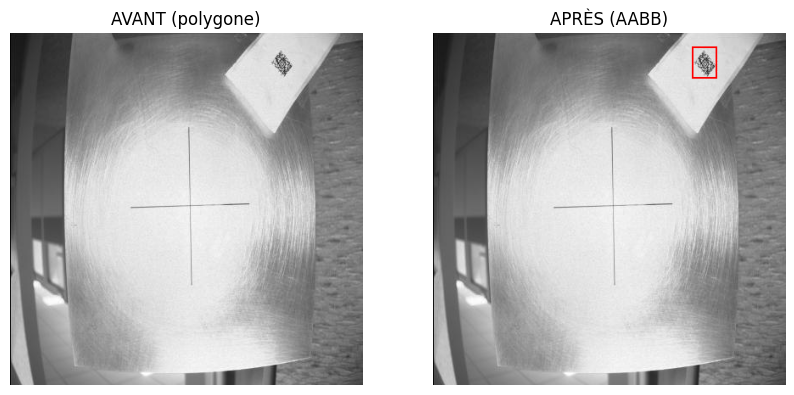

ℹ️ dm-and-qr-detection: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ dm-milk: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ dm_ciseaux: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ dmc-oriented-boxes-val: polygones convertis en AABB → ../datasets_clean/dmc-oriented-boxes-val/labels_aabb


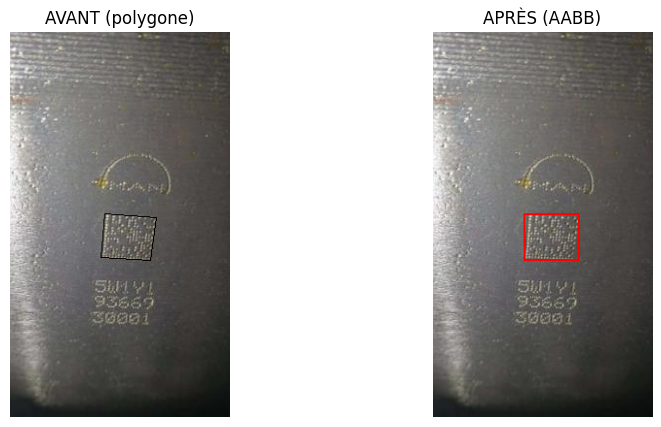

ℹ️ dmcode: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ dmefficientdet: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ dpm-codes: polygones convertis en AABB → ../datasets_clean/dpm-codes/labels_aabb


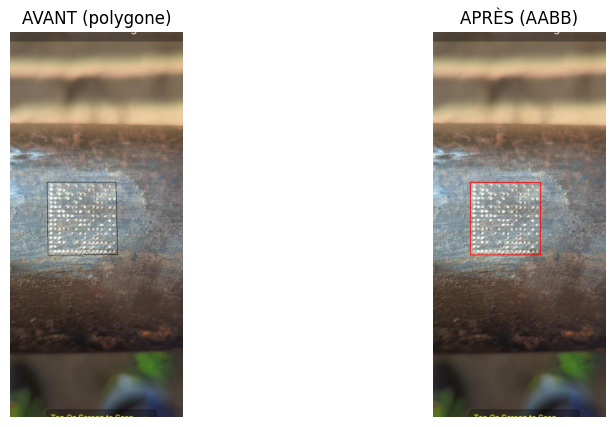

✅ icecream 2: polygones convertis en AABB → ../datasets_clean/icecream 2/labels_aabb


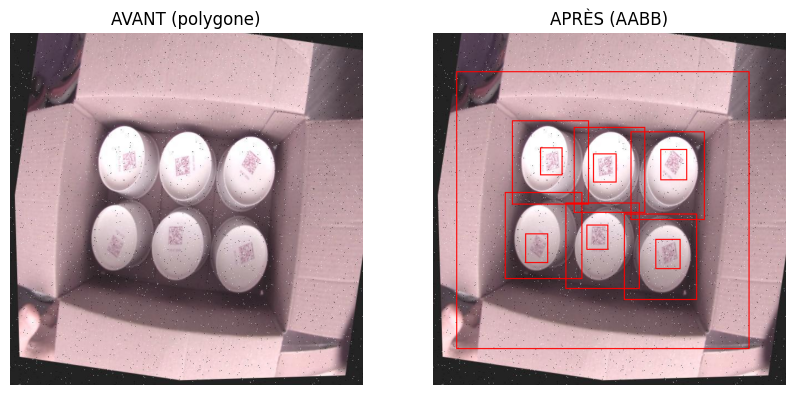

✅ implementacao: polygones convertis en AABB → ../datasets_clean/implementacao/labels_aabb


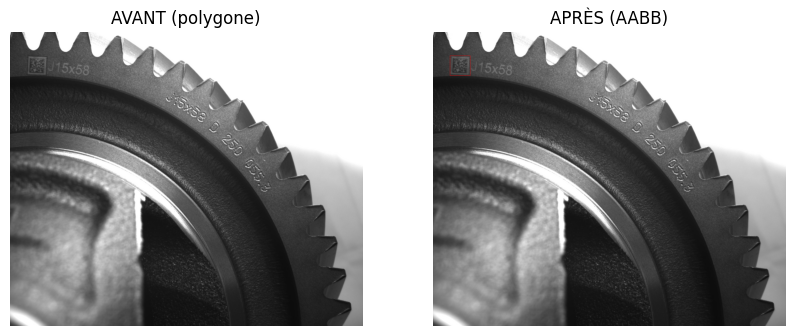

ℹ️ pcb_dataset-eislu: aucun polygone trouvé, labels copiés en bbox uniquement.
✅ qrcodedetect: polygones convertis en AABB → ../datasets_clean/qrcodedetect/labels_aabb


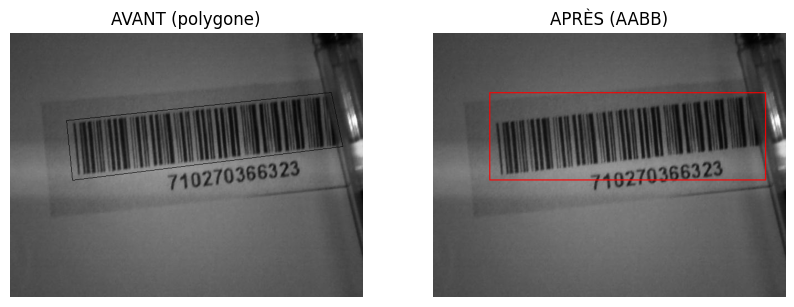

ℹ️ qrcut: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ real_2dcodes: aucun polygone trouvé, labels copiés en bbox uniquement.
ℹ️ recntagledmtest: aucun polygone trouvé, labels copiés en bbox uniquement.
⏭️  labels_aabb déjà présent pour version20opxub3qwo, skip.


In [7]:
# 
def read_yolo_label_file(label_path: Path):
    entries = []
    with open(label_path, "r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
            cls = int(float(parts[0]))
            coords = list(map(float, parts[1:]))
            entries.append((cls, coords))
    return entries

def is_polygon(coords):
    return len(coords) >= 8  # YOLO-seg (x1,y1,...)

def to_bbox(coords):
    xs = np.array(coords[0::2])
    ys = np.array(coords[1::2])
    xmin, xmax = xs.min(), xs.max()
    ymin, ymax = ys.min(), ys.max()
    w, h = xmax - xmin, ymax - ymin
    cx, cy = xmin + w/2, ymin + h/2
    return cx, cy, w, h

def write_labels(path: Path, entries):
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "w", encoding="utf-8") as f:
        for cls, (cx, cy, w, h) in entries:
            f.write(f"{cls} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n")

def draw_comparison(img_path, entries, entries_bbox):
    img = Image.open(img_path).convert("RGB")
    W, H = img.size

    before = img.copy()
    d1 = ImageDraw.Draw(before, "RGBA")
    for cls, coords in entries:
        if is_polygon(coords):
            pts = [(coords[i]*W, coords[i+1]*H) for i in range(0, len(coords), 2)]
            d1.polygon(pts, outline=(0,0,0,255))

    after = img.copy()
    d2 = ImageDraw.Draw(after, "RGBA")
    for cls, (cx, cy, w, h) in entries_bbox:
        xmin, ymin = (cx-w/2)*W, (cy-h/2)*H
        xmax, ymax = (cx+w/2)*W, (cy+h/2)*H
        d2.rectangle([xmin,ymin,xmax,ymax], outline=(255,0,0,255), width=2)

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1); plt.imshow(before); plt.axis("off"); plt.title("AVANT (polygone)")
    plt.subplot(1,2,2); plt.imshow(after); plt.axis("off"); plt.title("APRÈS (AABB)")
    plt.show()

# Parcours des datasets
for ds in sorted(DST_ROOT.iterdir()):
    if not ds.is_dir():
        continue
    lab_dir = ds / "labels"
    if not lab_dir.exists():
        continue

    out_lab_dir = ds / "labels_aabb"
    if out_lab_dir.exists():
        print(f"⏭️  labels_aabb déjà présent pour {ds.name}, skip.")
        continue

    converted = False
    for lf in sorted(lab_dir.rglob("*.txt")):
        entries = read_yolo_label_file(lf)
        out_entries = []
        for cls, coords in entries:
            if is_polygon(coords):
                cx, cy, w, h = to_bbox(coords)
                out_entries.append((cls, (cx, cy, w, h)))
                converted = True
            elif len(coords) == 4:  # déjà bbox
                cx, cy, w, h = coords
                out_entries.append((cls, (cx, cy, w, h)))
            else:
                print(f"⚠️ Format inattendu dans {lf} (len={len(coords)}), ligne ignorée.")

        out_path = out_lab_dir / lf.relative_to(lab_dir)
        write_labels(out_path, out_entries)

    if converted:
        print(f"✅ {ds.name}: polygones convertis en AABB → {out_lab_dir}")
        # montrer un exemple visuel
        sample_label = next(out_lab_dir.rglob("*.txt"))
        entries = read_yolo_label_file(sample_label)
        # retrouver image associée
        stem = sample_label.stem
        img_candidates = list((ds/"images").glob(stem+".*"))
        if img_candidates:
            draw_comparison(img_candidates[0], read_yolo_label_file(lab_dir/sample_label.name), entries)
    else:
        print(f"ℹ️ {ds.name}: aucun polygone trouvé, labels copiés en bbox uniquement.")

## Grayscale dataset

In [8]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}
ROOT = DST_ROOT  # ou un autre répertoire si besoin

def is_image(p: Path) -> bool:
    return p.is_file() and p.suffix.lower() in IMG_EXTS

def rel_image_set(src_dir: Path) -> set[str]:
    """Ensemble des chemins relatifs (avec noms de fichiers) sous src_dir pour les images."""
    return {str(p.relative_to(src_dir)) for p in src_dir.rglob("*") if is_image(p)}

datasets = [p for p in ROOT.iterdir() if p.is_dir()]
total_converted = 0

for ds in tqdm(datasets, desc="Datasets", unit="ds"):
    src_dir = ds / "images"
    if not src_dir.exists():
        tqdm.write(f"⚠️ {ds.name}: pas de dossier 'images' → skip")
        continue

    out_root = ds / "grayscale_dataset"
    out_root.mkdir(parents=True, exist_ok=True)

    # 🔎 Vérification skip intelligent : mêmes fichiers attendus ?
    src_rel = rel_image_set(src_dir)
    out_rel = rel_image_set(out_root)  # les fichiers déjà convertis
    if src_rel and src_rel == out_rel:
        tqdm.write(f"⏭️ {ds.name}: grayscale déjà à jour ({len(src_rel)} images) → skip")
        continue

    # Sinon, (re)convertir ce qui manque (ou tout)
    img_files = [p for p in src_dir.rglob("*") if is_image(p)]
    converted = 0

    for img_path in tqdm(img_files, desc=ds.name, leave=False, unit="img"):
        rel = img_path.relative_to(src_dir)
        out_path = out_root / rel
        out_path.parent.mkdir(parents=True, exist_ok=True)

        # Si on veut éviter de rouvrir les déjà présents et à jour:
        if out_path.exists():
            continue  # déjà converti précédemment (conserve vitesse)

        try:
            img = Image.open(img_path).convert("L")
            img.save(out_path)
            converted += 1
        except Exception as e:
            tqdm.write(f"⚠️ Erreur sur {img_path}: {e}")

    # Si certains manquaient (ou si on a choisi de ne pas sauter ceux existants), on peut faire un contrôle final :
    out_rel_final = rel_image_set(out_root)
    if src_rel == out_rel_final:
        tqdm.write(f"✅ {ds.name}: grayscale à jour ({len(out_rel_final)} images). Nouveaux convertis: {converted}")
    else:
        tqdm.write(f"ℹ️ {ds.name}: mismatch après conversion (src {len(src_rel)} vs out {len(out_rel_final)}).")

    total_converted += converted

print(f"🏁 Terminé. Nouveaux fichiers convertis: {total_converted}")

Datasets:   3%|▎         | 1/35 [00:11<06:22, 11.26s/ds]

✅ dm-milk: grayscale à jour (966 images). Nouveaux convertis: 966


Datasets:   6%|▌         | 2/35 [00:37<11:09, 20.28s/ds]

✅ datamatrix_140: grayscale à jour (305 images). Nouveaux convertis: 305


Datasets:   9%|▊         | 3/35 [00:38<05:56, 11.14s/ds]

✅ dmefficientdet: grayscale à jour (75 images). Nouveaux convertis: 75


Datasets:  11%|█▏        | 4/35 [00:38<03:32,  6.87s/ds]

⏭️ datamtarix: grayscale déjà à jour (4643 images) → skip


Datasets:  17%|█▋        | 6/35 [00:44<02:08,  4.44s/ds]

✅ asd: grayscale à jour (1489 images). Nouveaux convertis: 1489
⏭️ version20opxub3qwo: grayscale déjà à jour (2844 images) → skip


Datasets:  20%|██        | 7/35 [00:46<01:37,  3.48s/ds]

✅ Datamatrixsteel: grayscale à jour (81 images). Nouveaux convertis: 81


Datasets:  23%|██▎       | 8/35 [01:04<03:36,  8.02s/ds]

✅ bcdmp: grayscale à jour (1171 images). Nouveaux convertis: 1171


Datasets:  26%|██▌       | 9/35 [01:04<02:26,  5.63s/ds]

✅ datamatrixfit: grayscale à jour (51 images). Nouveaux convertis: 51


Datasets:  29%|██▊       | 10/35 [01:12<02:40,  6.43s/ds]

✅ dmcode: grayscale à jour (430 images). Nouveaux convertis: 430


Datasets:  31%|███▏      | 11/35 [01:16<02:11,  5.48s/ds]

✅ dm-and-qr-detection: grayscale à jour (648 images). Nouveaux convertis: 648


Datasets:  34%|███▍      | 12/35 [01:18<01:46,  4.62s/ds]

✅ qrcut: grayscale à jour (97 images). Nouveaux convertis: 97


Datasets:  37%|███▋      | 13/35 [01:21<01:32,  4.19s/ds]

✅ diffclass: grayscale à jour (1923 images). Nouveaux convertis: 1923


Datasets:  40%|████      | 14/35 [01:42<03:11,  9.14s/ds]

✅ dm_ciseaux: grayscale à jour (296 images). Nouveaux convertis: 296


Datasets:  43%|████▎     | 15/35 [01:43<02:14,  6.72s/ds]

✅ implementacao: grayscale à jour (50 images). Nouveaux convertis: 50


Datasets:  46%|████▌     | 16/35 [02:28<05:44, 18.14s/ds]

✅ 20240517: grayscale à jour (5411 images). Nouveaux convertis: 5411


Datasets:  49%|████▊     | 17/35 [02:36<04:31, 15.11s/ds]

✅ 2D_DETECTION: grayscale à jour (872 images). Nouveaux convertis: 872


Datasets:  51%|█████▏    | 18/35 [02:37<03:03, 10.79s/ds]

✅ DataMatrix2: grayscale à jour (275 images). Nouveaux convertis: 275


Datasets:  54%|█████▍    | 19/35 [02:37<02:01,  7.58s/ds]

✅ 2d_data_code_detect: grayscale à jour (199 images). Nouveaux convertis: 199


Datasets:  57%|█████▋    | 20/35 [02:37<01:20,  5.39s/ds]

✅ dpm-codes: grayscale à jour (50 images). Nouveaux convertis: 50


Datasets:  60%|██████    | 21/35 [02:40<01:03,  4.56s/ds]

✅ dmc-oriented-boxes-val: grayscale à jour (195 images). Nouveaux convertis: 195


Datasets:  63%|██████▎   | 22/35 [02:42<00:51,  3.94s/ds]

✅ Detector: grayscale à jour (450 images). Nouveaux convertis: 450


Datasets:  66%|██████▌   | 23/35 [02:42<00:34,  2.90s/ds]

✅ real_2dcodes: grayscale à jour (319 images). Nouveaux convertis: 319


Datasets:  69%|██████▊   | 24/35 [02:43<00:23,  2.18s/ds]

✅ DM_Code_DataSet: grayscale à jour (99 images). Nouveaux convertis: 99


Datasets:  71%|███████▏  | 25/35 [02:43<00:16,  1.67s/ds]

✅ qrcodedetect: grayscale à jour (276 images). Nouveaux convertis: 276


Datasets:  74%|███████▍  | 26/35 [02:53<00:35,  3.93s/ds]

✅ DataMatrixFridge: grayscale à jour (653 images). Nouveaux convertis: 653


Datasets:  80%|████████  | 28/35 [02:55<00:16,  2.42s/ds]

✅ data-matrix-codes: grayscale à jour (180 images). Nouveaux convertis: 180
⏭️ DataMatrix: grayscale déjà à jour (3236 images) → skip


Datasets:  83%|████████▎ | 29/35 [02:55<00:10,  1.75s/ds]

✅ pcb_dataset-eislu: grayscale à jour (30 images). Nouveaux convertis: 30


Datasets:  86%|████████▌ | 30/35 [02:55<00:06,  1.31s/ds]

✅ OR Code Detection: grayscale à jour (104 images). Nouveaux convertis: 104


Datasets:  89%|████████▊ | 31/35 [03:03<00:12,  3.11s/ds]

✅ 2dDataMatrix: grayscale à jour (891 images). Nouveaux convertis: 891


Datasets:  91%|█████████▏| 32/35 [03:05<00:08,  2.71s/ds]

✅ recntagledmtest: grayscale à jour (736 images). Nouveaux convertis: 736


Datasets:  94%|█████████▍| 33/35 [03:05<00:03,  1.99s/ds]

✅ DataMatrix_blur: grayscale à jour (227 images). Nouveaux convertis: 227


Datasets:  97%|█████████▋| 34/35 [03:09<00:02,  2.51s/ds]

✅ LiBattery DM Code Detection: grayscale à jour (842 images). Nouveaux convertis: 842


Datasets: 100%|██████████| 35/35 [03:10<00:00,  5.43s/ds]

✅ icecream 2: grayscale à jour (387 images). Nouveaux convertis: 387
🏁 Terminé. Nouveaux fichiers convertis: 19778


## Uniformiser les labels


📁 Dataset: 20240517
🏷️  Labels trouvés: ['0:1', '1:BD', '2:LINE', '3:SD']
💡 Remapping suggéré (à modifier) :
"20240517": {"0": "0", "1": "1", "2": "2", "3": "3"},


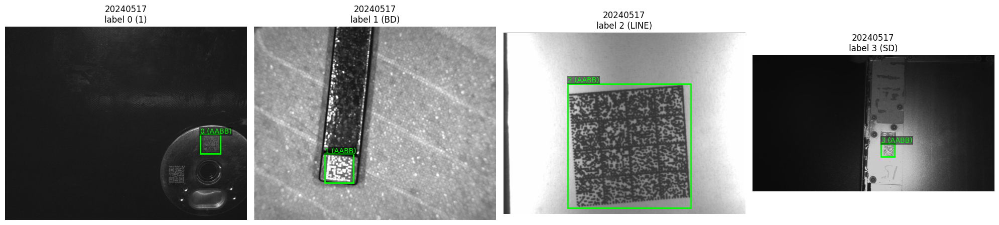


📁 Dataset: 2D_DETECTION
🏷️  Labels trouvés: ['0:DATAMATRIX']
💡 Remapping suggéré (à modifier) :
"2D_DETECTION": {"0": "0"},


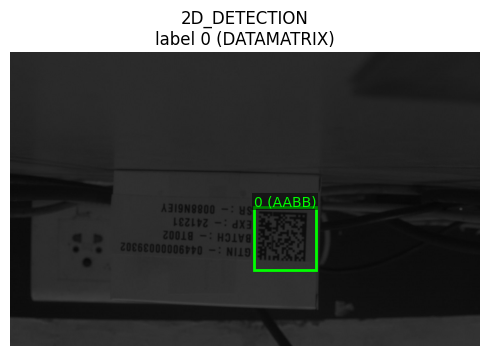


📁 Dataset: 2dDataMatrix
🏷️  Labels trouvés: ['0:D']
💡 Remapping suggéré (à modifier) :
"2dDataMatrix": {"0": "0"},


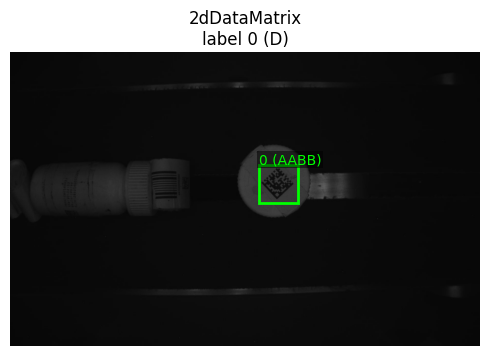


📁 Dataset: 2d_data_code_detect
🏷️  Labels trouvés: ['0:DM']
💡 Remapping suggéré (à modifier) :
"2d_data_code_detect": {"0": "0"},


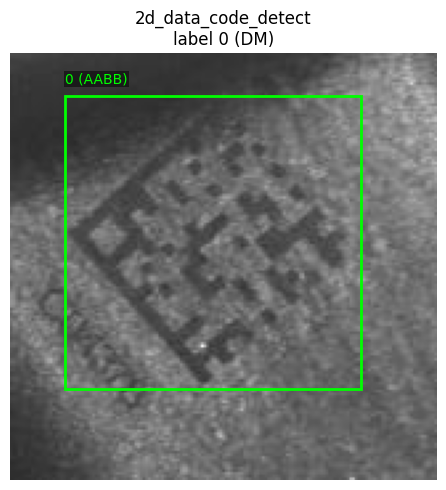


📁 Dataset: DM_Code_DataSet
🏷️  Labels trouvés: ['0:DM-Code']
💡 Remapping suggéré (à modifier) :
"DM_Code_DataSet": {"0": "0"},


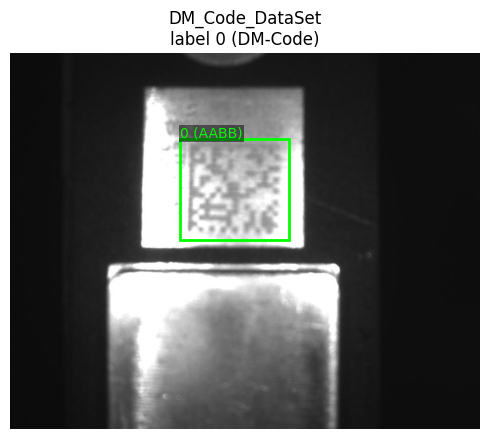


📁 Dataset: DataMatrix
🏷️  Labels trouvés: ['0']
💡 Remapping suggéré (à modifier) :
"DataMatrix": {"0": "0"},


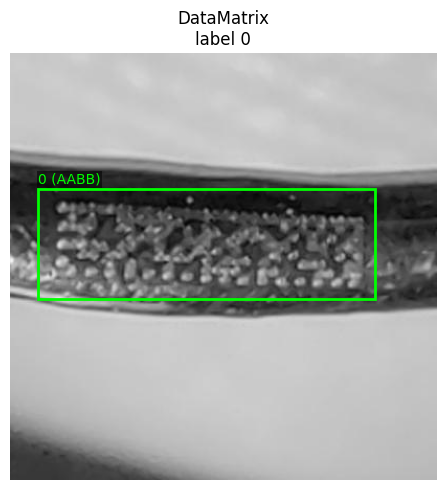


📁 Dataset: DataMatrix2
🏷️  Labels trouvés: ['0:------------------------------', '1:DATAMATRIX - v2 2024-11-15 11-53am']
💡 Remapping suggéré (à modifier) :
"DataMatrix2": {"0": "0", "1": "1"},


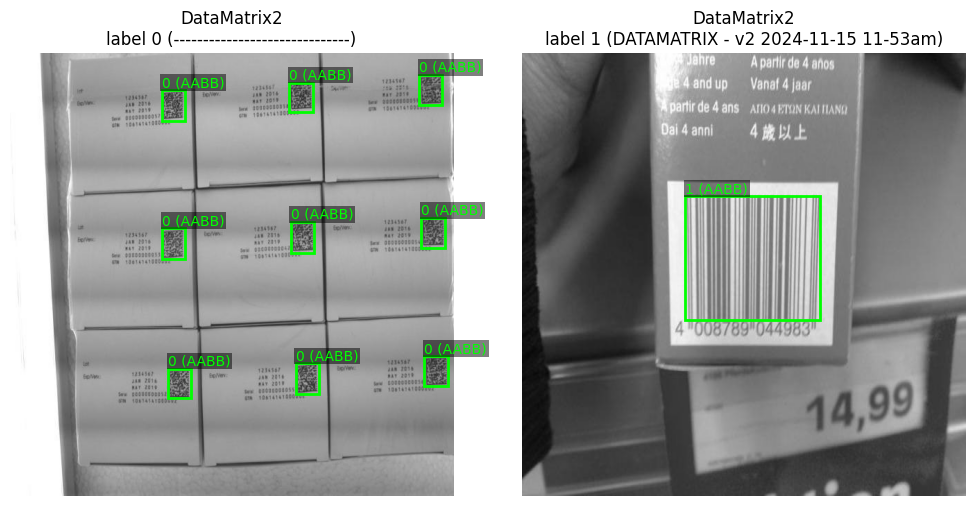


📁 Dataset: DataMatrixFridge
🏷️  Labels trouvés: ['0:Barcode', '1:DataMatrix', '2:PDF417', '3:QR']
💡 Remapping suggéré (à modifier) :
"DataMatrixFridge": {"0": "0", "1": "1", "2": "2", "3": "3"},


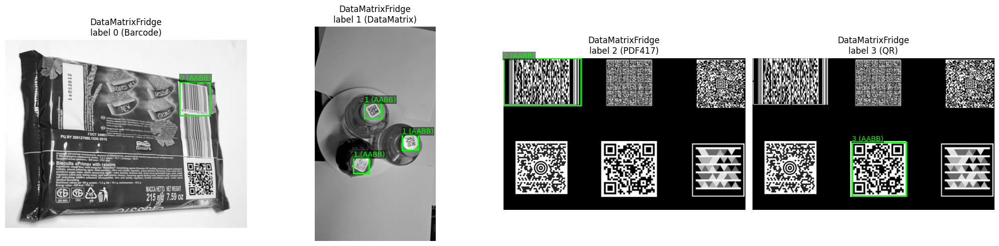


📁 Dataset: DataMatrix_blur
🏷️  Labels trouvés: ['0:DataMatrix']
💡 Remapping suggéré (à modifier) :
"DataMatrix_blur": {"0": "0"},


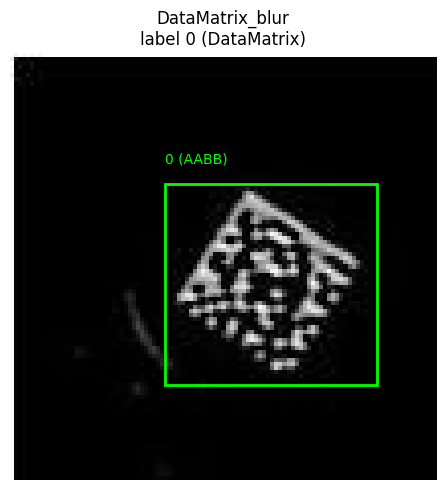


📁 Dataset: Datamatrixsteel
🏷️  Labels trouvés: ['0:Code-bGxK']
💡 Remapping suggéré (à modifier) :
"Datamatrixsteel": {"0": "0"},


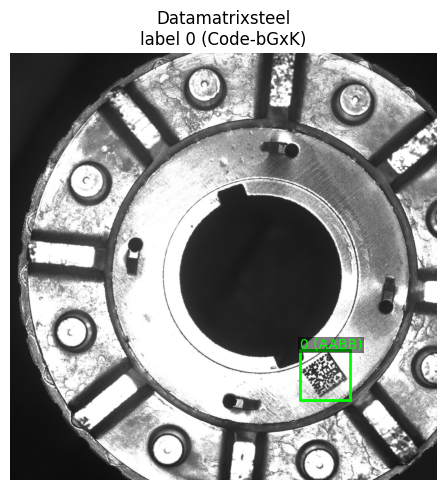


📁 Dataset: Detector
🏷️  Labels trouvés: ['0:DataMatrix']
💡 Remapping suggéré (à modifier) :
"Detector": {"0": "0"},


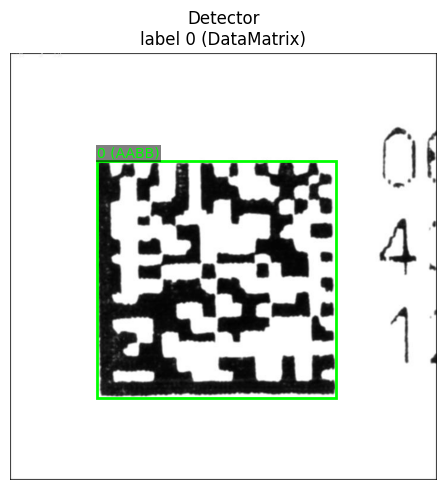


📁 Dataset: LiBattery DM Code Detection
🏷️  Labels trouvés: ['0:DM']
💡 Remapping suggéré (à modifier) :
"LiBattery DM Code Detection": {"0": "0"},


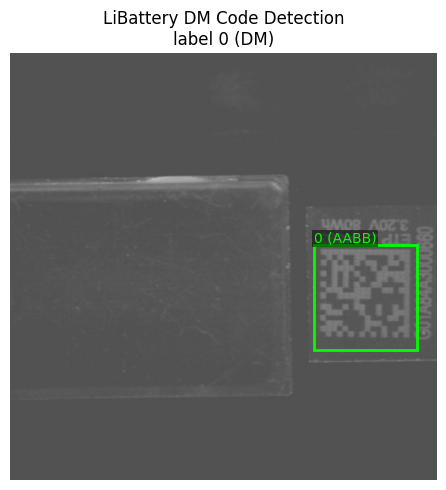


📁 Dataset: OR Code Detection
🏷️  Labels trouvés: ['0:QR-Codes']
💡 Remapping suggéré (à modifier) :
"OR Code Detection": {"0": "0"},


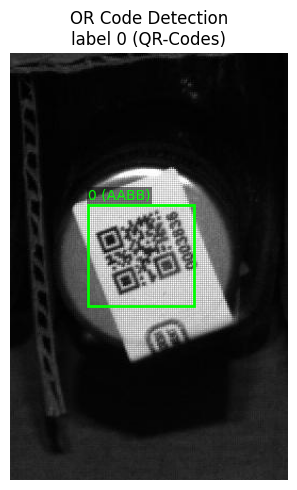


📁 Dataset: asd
🏷️  Labels trouvés: ['0:DM', '1:QR']
💡 Remapping suggéré (à modifier) :
"asd": {"0": "0", "1": "1"},


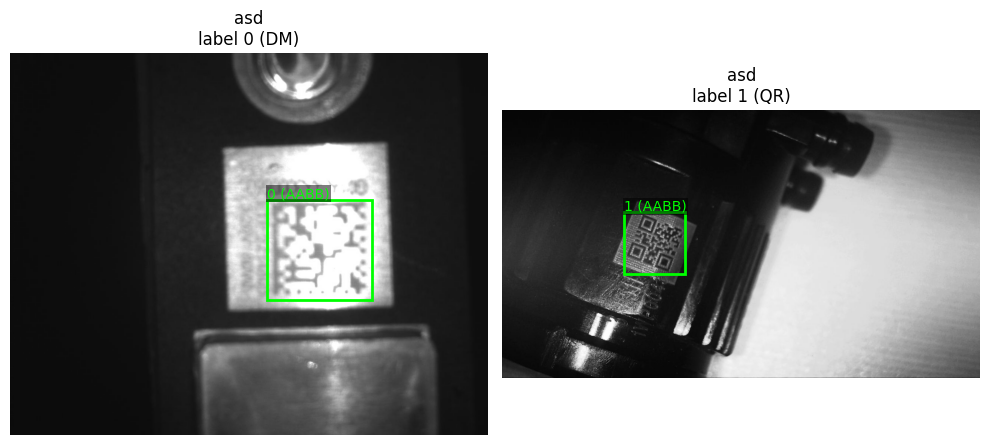


📁 Dataset: bcdmp
🏷️  Labels trouvés: ['0:barcode', '1:dmcode']
💡 Remapping suggéré (à modifier) :
"bcdmp": {"0": "0", "1": "1"},


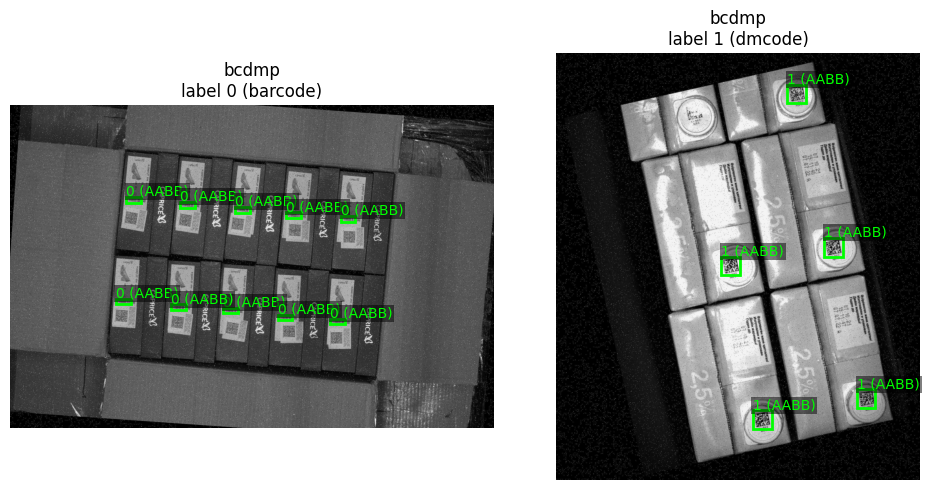


📁 Dataset: data-matrix-codes
🏷️  Labels trouvés: ['0:Data-Matrix']
💡 Remapping suggéré (à modifier) :
"data-matrix-codes": {"0": "0"},


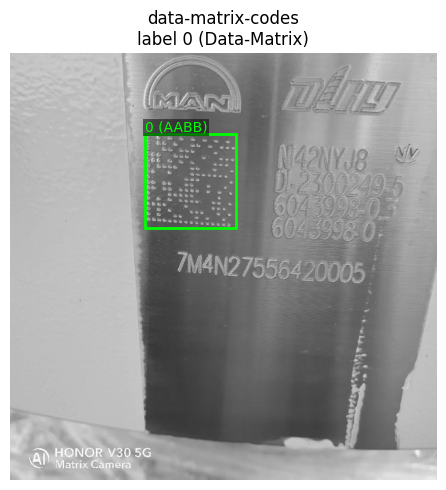


📁 Dataset: datamatrix_140
🏷️  Labels trouvés: ['0:DATAMATRIX']
💡 Remapping suggéré (à modifier) :
"datamatrix_140": {"0": "0"},


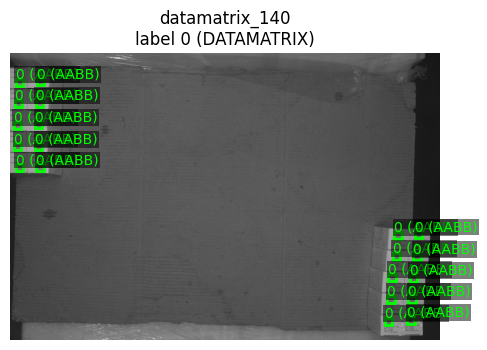


📁 Dataset: datamatrixfit
🏷️  Labels trouvés: ['0:DataMatrix']
💡 Remapping suggéré (à modifier) :
"datamatrixfit": {"0": "0"},


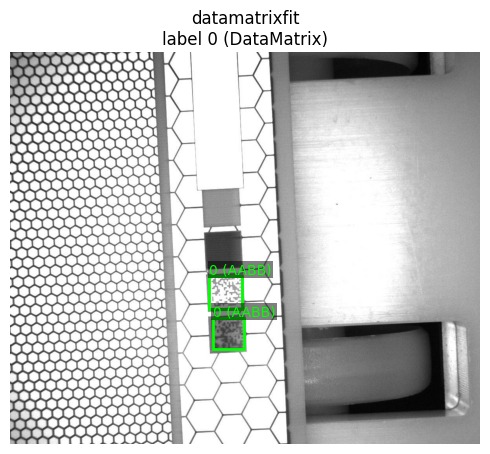


📁 Dataset: datamtarix
🏷️  Labels trouvés: ['0']
💡 Remapping suggéré (à modifier) :
"datamtarix": {"0": "0"},


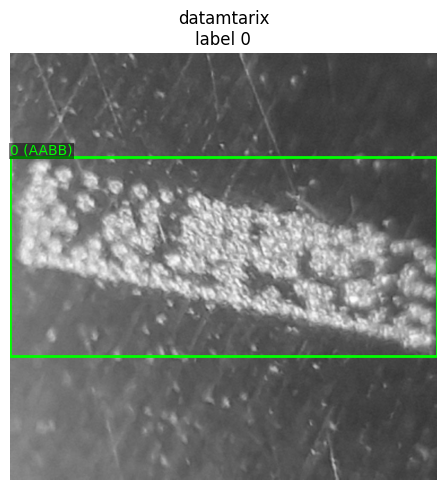


📁 Dataset: diffclass
🏷️  Labels trouvés: ['0:0', '1:1', '10:qrcode', '2:2', '3:3', '4:4', '5:Aztec', '6:Maxi', '7:PDF', '8:linear', '9:postcode']
💡 Remapping suggéré (à modifier) :
"diffclass": {"0": "0", "1": "1", "10": "10", "2": "2", "3": "3", "4": "4", "5": "5", "6": "6", "7": "7", "8": "8", "9": "9"},


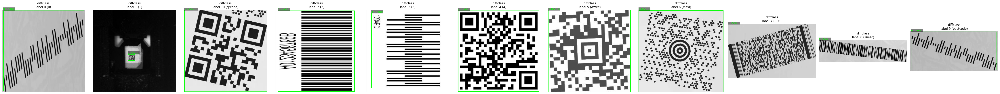


📁 Dataset: dm-and-qr-detection
🏷️  Labels trouvés: ['0:DM', '1:QR']
💡 Remapping suggéré (à modifier) :
"dm-and-qr-detection": {"0": "0", "1": "1"},


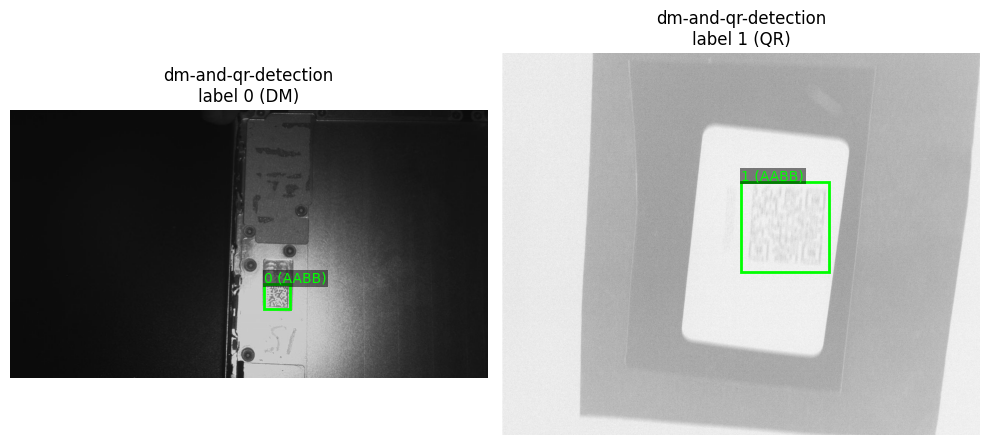


📁 Dataset: dm-milk
🏷️  Labels trouvés: ['0:dm']
💡 Remapping suggéré (à modifier) :
"dm-milk": {"0": "0"},


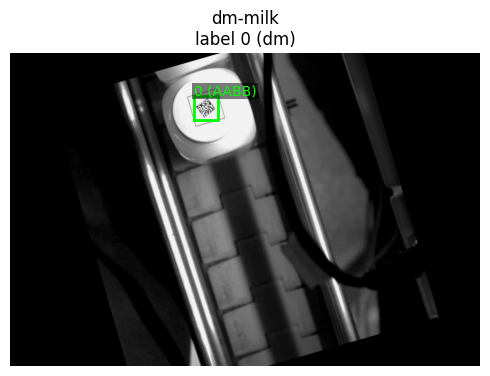


📁 Dataset: dm_ciseaux
🏷️  Labels trouvés: ['0:code']
💡 Remapping suggéré (à modifier) :
"dm_ciseaux": {"0": "0"},


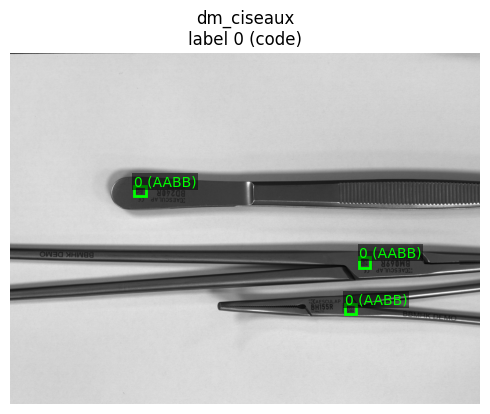


📁 Dataset: dmc-oriented-boxes-val
🏷️  Labels trouvés: ['0:dot-peen', '1:laser']
💡 Remapping suggéré (à modifier) :
"dmc-oriented-boxes-val": {"0": "0", "1": "1"},


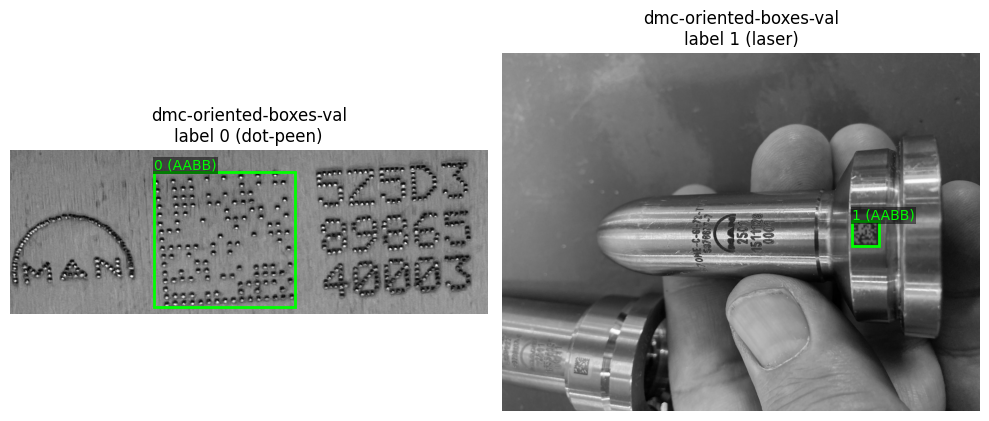


📁 Dataset: dmcode
🏷️  Labels trouvés: ['0:DataMatrix']
💡 Remapping suggéré (à modifier) :
"dmcode": {"0": "0"},


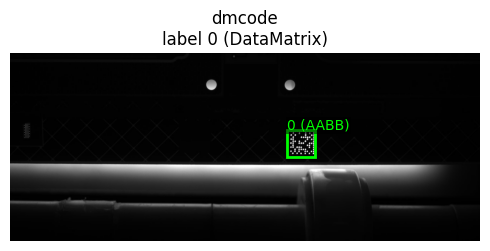


📁 Dataset: dmefficientdet
🏷️  Labels trouvés: ['0:0']
💡 Remapping suggéré (à modifier) :
"dmefficientdet": {"0": "0"},


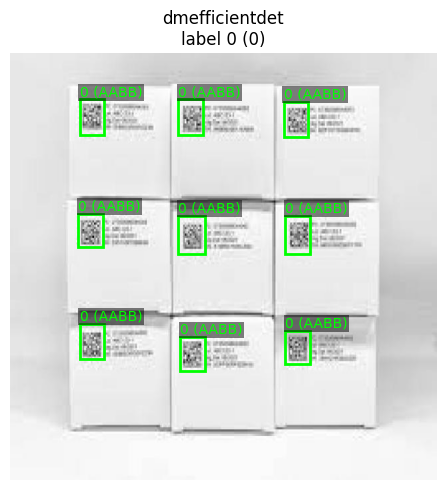


📁 Dataset: dpm-codes
🏷️  Labels trouvés: ['0:dpm-codes']
💡 Remapping suggéré (à modifier) :
"dpm-codes": {"0": "0"},


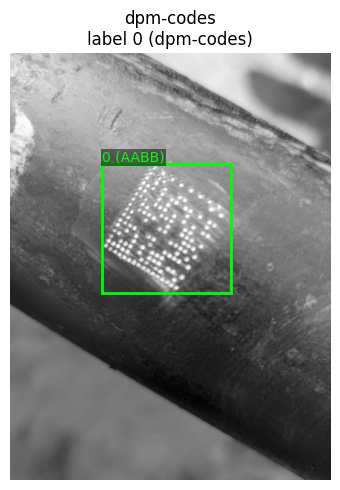


📁 Dataset: icecream 2
🏷️  Labels trouvés: ['0:box', '1:datamatrix', '2:jar']
💡 Remapping suggéré (à modifier) :
"icecream 2": {"0": "0", "1": "1", "2": "2"},


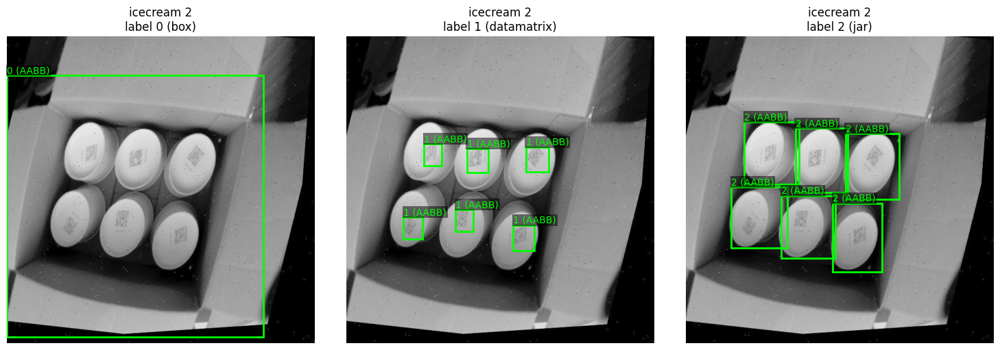


📁 Dataset: implementacao
🏷️  Labels trouvés: ['0:datamatrix']
💡 Remapping suggéré (à modifier) :
"implementacao": {"0": "0"},


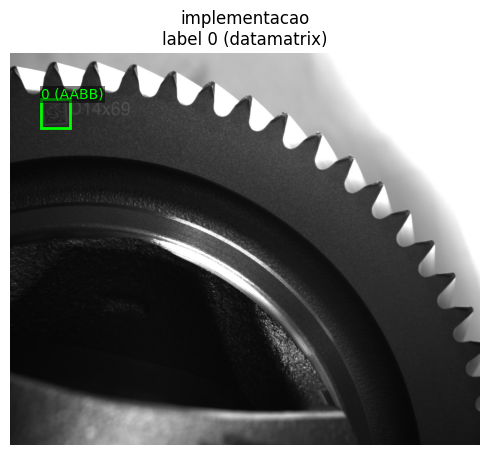


📁 Dataset: pcb_dataset-eislu
🏷️  Labels trouvés: ['0:PCB']
💡 Remapping suggéré (à modifier) :
"pcb_dataset-eislu": {"0": "0"},


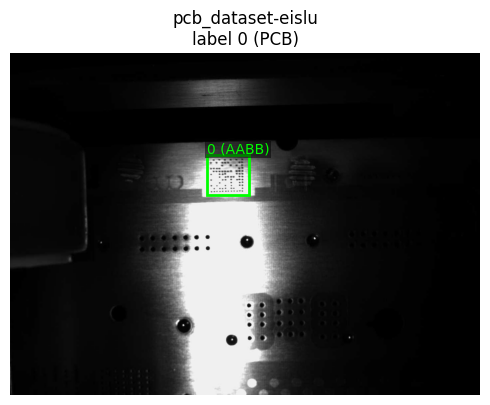


📁 Dataset: qrcodedetect
🏷️  Labels trouvés: ['0:barcode', '1:qrcode']
💡 Remapping suggéré (à modifier) :
"qrcodedetect": {"0": "0", "1": "1"},


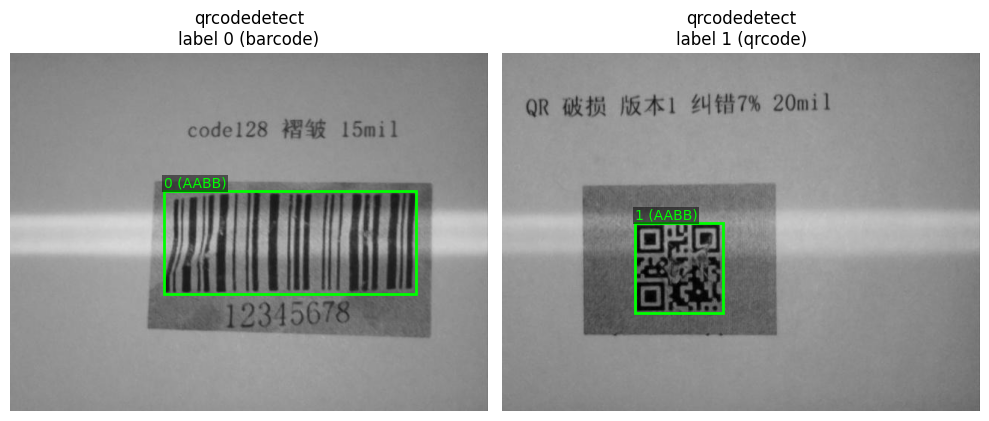


📁 Dataset: qrcut
🏷️  Labels trouvés: ['0:qr']
💡 Remapping suggéré (à modifier) :
"qrcut": {"0": "0"},


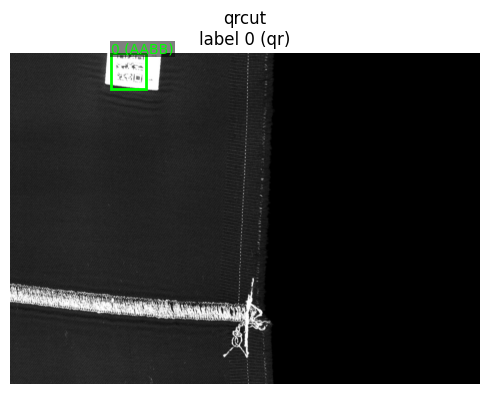


📁 Dataset: real_2dcodes
🏷️  Labels trouvés: ['0:Polyline', '1:dotted_Polyline']
💡 Remapping suggéré (à modifier) :
"real_2dcodes": {"0": "0", "1": "1"},


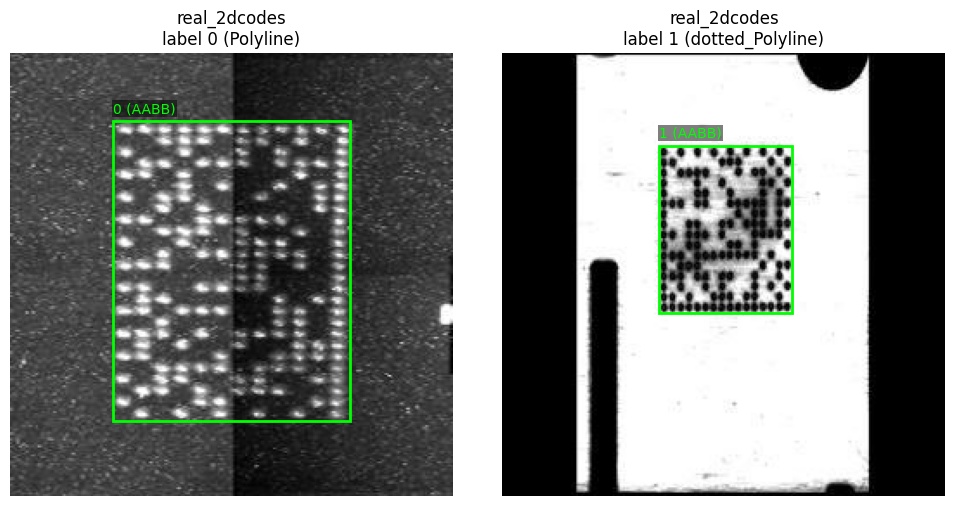


📁 Dataset: recntagledmtest
🏷️  Labels trouvés: ['0:RectDM']
💡 Remapping suggéré (à modifier) :
"recntagledmtest": {"0": "0"},


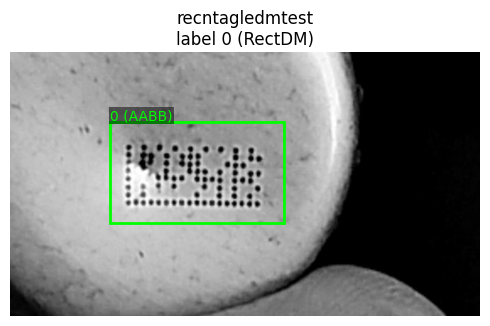


📁 Dataset: version20opxub3qwo
🏷️  Labels trouvés: ['0']
💡 Remapping suggéré (à modifier) :
"version20opxub3qwo": {"0": "0"},


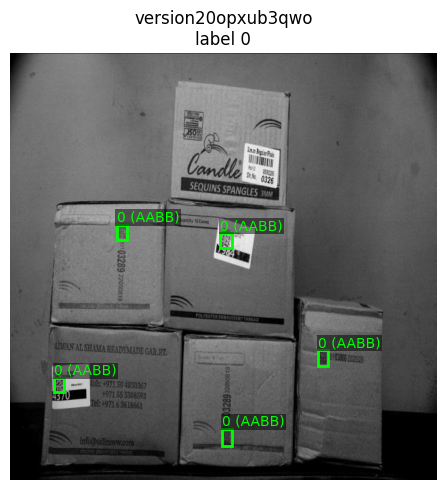

In [9]:
# ----- CONFIG -----
BASE_DIR = Path("../datasets_clean")
IMG_DIR_CANDIDATES = ["grayscale_dataset", "images"]           # ordre de priorité
LABEL_DIR_CANDIDATES = [ "labels_aabb", "labels"]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}
RANDOM_SEED = 42            # pour reproductibilité du choix d'images
MAX_EXAMPLES_PER_DATASET = None  # None = montre tous les labels ; sinon limite (ex: 8)

# Tente d'utiliser yaml si dispo pour lire data.yaml (noms de classes)
try:
    import yaml
except Exception:
    yaml = None

def read_labels(file_path: Path):
    """Lit un fichier .txt YOLO; renvoie [(label(str), type('bbox'/'polygon'/'unknown'), coords[list[float]])]."""
    labels = []
    try:
        with open(file_path, "r", encoding="utf-8") as f:
            for line in f:
                line = line.strip()
                if not line or line.startswith("#"):
                    continue
                parts = line.split()
                if len(parts) < 2:
                    continue
                label = parts[0]
                coords = list(map(float, parts[1:]))

                # Heuristique type d'annotation
                if len(coords) == 4:
                    ann_type = "bbox"
                elif len(coords) >= 8 and len(coords) % 2 == 0:
                    ann_type = "polygon"
                elif len(coords) >= 8 and len(coords) % 2 == 1:
                    # Certains exports YOLO-seg peuvent inclure un score à la fin → on tolère en coupant le dernier
                    coords = coords[:-1]
                    ann_type = "polygon" if len(coords) >= 8 and len(coords) % 2 == 0 else "unknown"
                else:
                    ann_type = "unknown"

                labels.append((label, ann_type, coords))
    except Exception as e:
        print(f"⚠️  Lecture labels échouée: {file_path} ({e})")
    return labels

def list_images(img_root: Path):
    return [p for p in img_root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]

def find_dir(root: Path, candidates):
    for name in candidates:
        p = root / name
        if p.exists() and p.is_dir():
            return p
    return None

def try_load_classnames(ds_root: Path):
    """Lit data.yaml|yml|dataset.yaml|yml pour obtenir names si possible."""
    if yaml is None:
        return None
    for cand in ("data.yaml", "data.yml", "dataset.yaml", "dataset.yml"):
        y = ds_root / cand
        if y.exists():
            try:
                data = yaml.safe_load(y.read_text(encoding="utf-8"))
                # YOLO: names peut être dict {id:name} ou list
                names = data.get("names")
                if isinstance(names, dict):
                    # normaliser clés (str->int si possible)
                    fixed = {}
                    for k, v in names.items():
                        try:
                            fixed[int(k)] = v
                        except Exception:
                            fixed[k] = v
                    return fixed
                elif isinstance(names, list):
                    return {i: n for i, n in enumerate(names)}
            except Exception as e:
                print(f"ℹ️  Impossible de lire names depuis {y.name}: {e}")
    return None

random.seed(RANDOM_SEED)

for ds_root in sorted([p for p in BASE_DIR.iterdir() if p.is_dir()]):
    img_dir = find_dir(ds_root, IMG_DIR_CANDIDATES)
    if img_dir is None:
        print(f"⚠️  {ds_root.name}: pas d'images (ni 'grayscale_dataset' ni 'images'), skip.")
        continue

    label_dir = find_dir(ds_root, LABEL_DIR_CANDIDATES)
    if label_dir is None:
        print(f"⚠️  {ds_root.name}: pas de labels (ni {', '.join(LABEL_DIR_CANDIDATES)}), skip.")
        continue

    # Charger éventuels noms de classes
    classnames = try_load_classnames(ds_root)

    # Associer un exemple d'image par label
    images = list_images(img_dir)
    if not images:
        print(f"⚠️  {ds_root.name}: aucune image trouvée, skip.")
        continue

    # On mélange pour échantillonnage représentatif
    random.shuffle(images)

    label_to_image = {}  # label(str) -> (img_path, [(label, ann_type, coords), ...] pour cette image)
    for img_path in images:
        label_path = label_dir / (img_path.stem + ".txt")
        if not label_path.exists():
            continue
        anns = read_labels(label_path)
        if not anns:
            continue
        # Ajoute le premier exemple rencontré par label
        for lab, ann_type, coords in anns:
            if lab not in label_to_image:
                label_to_image[lab] = (img_path, [(lab, ann_type, coords)])

        # Stop si on a atteint la limite optionnelle
        if MAX_EXAMPLES_PER_DATASET is not None and len(label_to_image) >= MAX_EXAMPLES_PER_DATASET:
            break

    if not label_to_image:
        print(f"ℹ️  {ds_root.name}: aucun label détecté (ou pas de correspondance image/label).")
        continue

    # Joli titre + noms de classes si dispos
    # Essaye d’interpréter les labels comme des entiers pour afficher le nom de classe
    label_list = sorted(label_to_image.keys(), key=lambda x: (not re.fullmatch(r"\d+", x), x))
    readable = []
    for lab in label_list:
        if classnames is not None and re.fullmatch(r"\d+", lab):
            idx = int(lab)
            cname = classnames.get(idx, "(?)")
            readable.append(f"{lab}:{cname}")
        else:
            readable.append(lab)

    print(f"\n📁 Dataset: {ds_root.name}")
    print(f"🏷️  Labels trouvés: {readable}")
    print("💡 Remapping suggéré (à modifier) :")
    print(f'"{ds_root.name}": {{' + ", ".join([f'"{lab}": "{lab}"' for lab in label_list]) + "},")

    # Affichage : une image par label
    n = len(label_list)
    fig, axs = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axs = [axs]

    for ax, lab in zip(axs, label_list):
        img_path, _ = label_to_image[lab]
        image = Image.open(img_path).convert("RGB")
        w, h = image.size

        ax.imshow(image)  # si grayscale, Matplotlib la montrera en niveaux de gris
        # Titre enrichi avec nom de classe si connu
        if classnames is not None and re.fullmatch(r"\d+", lab):
            cname = classnames.get(int(lab), "(?)")
            ax.set_title(f"{ds_root.name}\nlabel {lab} ({cname})")
        else:
            ax.set_title(f"{ds_root.name}\nlabel {lab}")

        # Dessiner les annotations de CE label uniquement
        label_file = label_dir / f"{img_path.stem}.txt"
        all_anns = read_labels(label_file)

        for l, ann_type, coords in all_anns:
            if l != lab:
                continue

            if ann_type == "bbox" and len(coords) == 4:
                x_center, y_center, box_width, box_height = coords
                x = (x_center - box_width / 2) * w
                y = (y_center - box_height / 2) * h
                bw = box_width * w
                bh = box_height * h
                rect = patches.Rectangle((x, y), bw, bh, linewidth=2, edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                ax.text(x, max(0, y - 5), f"{l} (AABB)", color='lime', fontsize=10,
                        bbox=dict(facecolor="black", alpha=0.5, edgecolor="none", pad=1))

            elif ann_type == "polygon" and len(coords) >= 8:
                xs = coords[0::2]
                ys = coords[1::2]
                polygon_points = [(xx * w, yy * h) for xx, yy in zip(xs, ys)]
                poly_patch = patches.Polygon(polygon_points, closed=True, edgecolor='red', linewidth=2, fill=False)
                ax.add_patch(poly_patch)
                x0, y0 = polygon_points[0]
                ax.text(x0, max(0, y0 - 5), f"{l} (Poly)", color='red', fontsize=10,
                        bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1))

            else:
                # inconnu → on ne dessine pas, mais on signale en petit
                ax.text(5, 15, f"{l} (unknown)", color='yellow', fontsize=9,
                        bbox=dict(facecolor="black", alpha=0.5, edgecolor="none", pad=1))

        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [10]:
from pathlib import Path
from typing import Optional, List, Tuple, Dict, Set
from collections import Counter


# ---------- CONFIG COMMUNE ----------
BASE_DIR = Path("../datasets_clean")
LABEL_DIR_CANDIDATES = ["labels_aabb", "labels"]           # cohérent avec tes 2 codes
IMG_DIR_CANDIDATES   = ["grayscale_dataset", "images"]
IMG_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"]
DELETE_TOKEN = "__DELETE__"

# ---------- UTILITAIRES I/O ----------
def find_first_subdir(root: Path, names: List[str]) -> Optional[Path]:
    for n in names:
        p = root / n
        if p.exists() and p.is_dir():
            return p
    return None

def read_label_lines(lbl_path: Path) -> List[Tuple[str, List[float]]]:
    """
    Lit un .txt YOLO -> [(label:str, coords:list[float]), ...]
    (ne force pas bbox/seg; on conserve juste les valeurs)
    """
    out: List[Tuple[str, List[float]]] = []
    try:
        with lbl_path.open("r", encoding="utf-8") as f:
            for line in f:
                line = line.strip()
                if not line or line.startswith("#"):
                    continue
                parts = line.split()
                lab = parts[0]
                coords: List[float] = []
                if len(parts) > 1:
                    try:
                        coords = list(map(float, parts[1:]))
                    except Exception:
                        coords = []
                out.append((lab, coords))
    except Exception as e:
        print(f"⚠️  Lecture impossible: {lbl_path} ({e})")
    return out

def write_label_lines(lbl_path: Path, entries: List[Tuple[str, List[float]]]) -> None:
    lbl_path.parent.mkdir(parents=True, exist_ok=True)
    with lbl_path.open("w", encoding="utf-8") as f:
        for lab, coords in entries:
            if coords:
                f.write(f"{lab} " + " ".join(f"{x:.6f}" for x in coords) + "\n")
            else:
                f.write(f"{lab}\n")

def delete_image_if_needed(ds_root: Path, stem: str, dry_run: bool = True) -> None:
    """
    Supprime l'image correspondante (dans grayscale_dataset/ et/ou images/) si plus aucune annotation après traitement.
    On NE touche PAS aux labels d'origine; les labels nettoyés sont écrits dans labels_unified/ ou labels_distinct/.
    """
    for img_dir in IMG_DIR_CANDIDATES:
        idir = ds_root / img_dir
        if not idir.exists():
            continue
        for ext in IMG_EXTS:
            ipath = idir / f"{stem}{ext}"
            if ipath.exists():
                if dry_run:
                    print(f"   • DRY-RUN delete {ipath}")
                else:
                    try:
                        ipath.unlink()
                    except Exception as e:
                        print(f"   ⚠️ Échec suppression image {ipath}: {e}")

# ---------- INVENTAIRE DES LABELS + GABARIT MAPPING ----------
def list_all_labels_in_dataset(ds_root: Path) -> Set[str]:
    labels_dir = find_first_subdir(ds_root, LABEL_DIR_CANDIDATES)
    if labels_dir is None:
        return set()
    labs: Set[str] = set()
    for txt in labels_dir.rglob("*.txt"):
        for lab, _coords in read_label_lines(txt):
            labs.add(lab)
    return labs

def build_ops_template() -> None:
    """
    Print une liste de tuples prête à remplir et à passer à apply_label_ops().
    Valeurs à remplir par dataset: "__DELETE__" pour supprimer, "0" (ou autre) pour renommer.
    """
    tuples: List[Tuple[str, Dict[str, str]]] = []
    for ds_root in sorted([p for p in BASE_DIR.iterdir() if p.is_dir()]):
        labs = sorted(list_all_labels_in_dataset(ds_root), key=lambda x: (not x.isdigit(), x))
        if not labs:
            continue
        mapping = {lab: "" for lab in labs}
        tuples.append((ds_root.name, mapping))

    print("### Remplis les valeurs et passe ce résultat à apply_label_ops(ops, ...) ###\n")
    print("[")
    for name, mapping in tuples:
        items = ", ".join([f'"{k}": "{v}"' for k, v in mapping.items()])
        print(f'  ("{name}", {{{items}}}),')
    print("]")

# ---------- TRAITEMENT PRINCIPAL ----------


def _hist_from_entries_list(entries_list: List[List[Tuple[str, List[float]]]]) -> Counter:
    hist = Counter()
    for entries in entries_list:
        for lab, _coords in entries:
            hist[lab] += 1
    return hist

def apply_label_ops(
    ops: List[Tuple[str, Dict[str, str]]],
    unified: bool = False,
    dry_run: bool = True
) -> None:
    ops_map: Dict[str, Dict[str, str]] = {name: mapping for name, mapping in ops}
    grand_total = {"datasets_done": 0, "files_written": 0, "images_deleted": 0, "ann_before": 0, "ann_after": 0}
    print("=== Résumé par dataset ===")

    for ds_root in sorted([p for p in BASE_DIR.iterdir() if p.is_dir()]):
        ds_name = ds_root.name
        mapping = ops_map.get(ds_name)
        if not mapping:
            continue

        labels_dir = find_first_subdir(ds_root, LABEL_DIR_CANDIDATES)
        if labels_dir is None:
            print(f"- {ds_name}: ⚠️ pas de labels → skip")
            continue

        out_dir = ds_root / ("labels_unified" if unified else "labels_distinct")
        if not dry_run:
            out_dir.mkdir(parents=True, exist_ok=True)

        files_processed = 0
        files_written = 0
        images_deleted = 0
        before_entries_all: List[List[Tuple[str, List[float]]]] = []
        after_entries_all:  List[List[Tuple[str, List[float]]]] = []
        deleted_hist = Counter()

        for lbl_path in labels_dir.rglob("*.txt"):
            entries = read_label_lines(lbl_path)
            if not entries:
                if not dry_run:
                    delete_image_if_needed(ds_root, lbl_path.stem, dry_run=False)
                    images_deleted += 1
                files_processed += 1
                before_entries_all.append([])
                after_entries_all.append([])
                continue

            if unified:
                new_entries: List[Tuple[str, List[float]]] = []
                for lab, coords in entries:
                    if lab in mapping and mapping[lab] == DELETE_TOKEN:
                        deleted_hist[lab] += 1
                        continue
                    new_entries.append(("0", coords))
            else:
                new_entries = []
                for lab, coords in entries:
                    if lab in mapping:
                        target = mapping[lab]
                        if target == DELETE_TOKEN:
                            deleted_hist[lab] += 1
                            continue
                        elif target != "":
                            new_entries.append((target, coords))
                        else:
                            new_entries.append((lab, coords))
                    else:
                        new_entries.append((lab, coords))

            if not new_entries:
                if not dry_run:
                    delete_image_if_needed(ds_root, lbl_path.stem, dry_run=False)
                    images_deleted += 1
            else:
                if not dry_run:
                    write_label_lines(out_dir / lbl_path.name, new_entries)
                    files_written += 1

            files_processed += 1
            before_entries_all.append(entries)
            after_entries_all.append(new_entries)

        hist_before = _hist_from_entries_list(before_entries_all)
        hist_after  = _hist_from_entries_list(after_entries_all)
        ann_before  = sum(hist_before.values())
        ann_after   = sum(hist_after.values())

        grand_total["datasets_done"] += 1
        grand_total["files_written"] += files_written
        grand_total["images_deleted"] += images_deleted
        grand_total["ann_before"] += ann_before
        grand_total["ann_after"]  += ann_after

        mode_name = "UNIFIED→labels_unified" if unified else "SEPARATE→labels_distinct"
        print(f"- {ds_name} [{mode_name}]")
        print(f"    label files traités : {files_processed}")
        print(f"    annotations (totale): {ann_before} → {ann_after}")
        print(f"    images supprimées    : {images_deleted}")
        print(f"    labels écrits        : {files_written}")

        # Suppressions par label
        if deleted_hist:
            print(f"    SUPPRESSIONS par label:")
            for k in sorted(deleted_hist.keys(), key=lambda x: (not str(x).isdigit(), str(x))):
                print(f"      {k}: {deleted_hist[k]}")

        # Histogrammes avant → après (compact)
        all_keys = sorted(set(hist_before.keys()) | set(hist_after.keys()),
                          key=lambda x: (not str(x).isdigit(), str(x)))
        if all_keys:
            print("    labels (avant → après):")
            MAX_SHOW = 30
            for k in all_keys[:MAX_SHOW]:
                print(f"      {k}: {hist_before.get(k,0)} → {hist_after.get(k,0)}")
            if len(all_keys) > MAX_SHOW:
                print(f"      ... (+{len(all_keys)-MAX_SHOW} labels)")

    print("\n=== Résumé global ===")
    print(f"datasets traités      : {grand_total['datasets_done']}")
    print(f"labels écrits (total) : {grand_total['files_written']}")
    print(f"images supprimées     : {grand_total['images_deleted']}")
    print(f"annotations (total)   : {grand_total['ann_before']} → {grand_total['ann_after']}")
    print(f"mode                  : {'UNIFIED' if unified else 'SEPARATE'} | {'DRY-RUN' if dry_run else 'APPLIQUÉ'}")

In [11]:
build_ops_template()

### Remplis les valeurs et passe ce résultat à apply_label_ops(ops, ...) ###

[
  ("20240517", {"0": "", "1": "", "2": "", "3": ""}),
  ("2D_DETECTION", {"0": ""}),
  ("2dDataMatrix", {"0": ""}),
  ("2d_data_code_detect", {"0": ""}),
  ("DM_Code_DataSet", {"0": ""}),
  ("DataMatrix", {"0": ""}),
  ("DataMatrix2", {"0": "", "1": ""}),
  ("DataMatrixFridge", {"0": "", "1": "", "2": "", "3": ""}),
  ("DataMatrix_blur", {"0": ""}),
  ("Datamatrixsteel", {"0": ""}),
  ("Detector", {"0": ""}),
  ("LiBattery DM Code Detection", {"0": ""}),
  ("OR Code Detection", {"0": ""}),
  ("asd", {"0": "", "1": ""}),
  ("bcdmp", {"0": "", "1": ""}),
  ("data-matrix-codes", {"0": ""}),
  ("datamatrix_140", {"0": ""}),
  ("datamatrixfit", {"0": ""}),
  ("datamtarix", {"0": ""}),
  ("diffclass", {"0": "", "1": "", "10": "", "2": "", "3": "", "4": "", "5": "", "6": "", "7": "", "8": "", "9": ""}),
  ("dm-and-qr-detection", {"0": "", "1": ""}),
  ("dm-milk", {"0": ""}),
  ("dm_ciseaux", {"0": ""}),
  ("dmc-or

In [12]:

ops =[
  ("20240517", {"0": "0", "1": "0", "2": "0", "3": "0"}),           # Beaucoup de label pour rien
  ("2D_DETECTION", {"0": "0"}),
  ("2dDataMatrix", {"0": "0"}),
  ("2d_data_code_detect", {"0": "0"}),
  ("DM_Code_DataSet", {"0": "0"}),
  ("DataMatrix", {"0": "0"}),
  ("datamtarix", {"0": "0"}),
  ("DataMatrix2", {"0": "0", "1": "__DELETE__"}),                    # 1 = barcode
  ("DataMatrixFridge", {"0": "__DELETE__", "1": "0", "2": "__DELETE__", "3": "1"}),
  ("DataMatrix_blur", {"0": "0"}),
  ("Datamatrixsteel", {"0": "0"}),
  ("Detector", {"0": "0"}),
  ("LiBattery DM Code Detection", {"0": "0"}),
  ("OR Code Detection", {"0": "1"}),
  ("asd", {"0": "0", "1": "1"}),
  ("bcdmp", {"0": "__DELETE__", "1": "0"}),
  ("data-matrix-codes", {"0": "0"}),
  ("datamatrix_140", {"0": "0"}),
  ("datamatrixfit", {"0": "0"}),
  ("diffclass", {"0": "0", "1": "0", "10": "1", "2": "__DELETE__", "3": "__DELETE__", "4": "1", "5": "__DELETE__", "6": "__DELETE__", "7": "__DELETE__", "8": "__DELETE__", "9": "__DELETE__"}),
  ("dm-and-qr-detection", {"0": "0", "1": "1"}),
  ("dm-milk", {"0": "0"}),
  ("dm_ciseaux", {"0": "0"}),
  ("dmc-oriented-boxes-val", {"0": "0", "1": "0"}),
  ("dmcode", {"0": "0"}),
  ("dmefficientdet", {"0": "0"}),
  ("dpm-codes", {"0": "0"}),
  ("icecream 2", {"0": "__DELETE__", "1": "0", "2": "__DELETE__"}),
  ("implementacao", {"0": "0"}),
  ("pcb_dataset-eislu", {"0": "0"}),
  ("qrcodedetect", {"0": "__DELETE__", "1": "1"}),
  ("qrcut", {"0": "1"}),
  ("real_2dcodes", {"0": "0", "1": "0"}),
  ("recntagledmtest", {"0": "0"}),
  ("version20opxub3qwo", {"0": "1"}),
]



In [29]:
apply_label_ops(ops, unified=True,  dry_run=False)   # tout unifié vers "0" sauf DELETE


=== Résumé par dataset ===
- 20240517 [UNIFIED→labels_unified]
    label files traités : 5411
    annotations (totale): 5718 → 5718
    images supprimées    : 0
    labels écrits        : 5411
    labels (avant → après):
      0: 5718 → 5718
- 2D_DETECTION [UNIFIED→labels_unified]
    label files traités : 861
    annotations (totale): 861 → 861
    images supprimées    : 0
    labels écrits        : 861
    labels (avant → après):
      0: 861 → 861
- 2dDataMatrix [UNIFIED→labels_unified]
    label files traités : 889
    annotations (totale): 891 → 891
    images supprimées    : 0
    labels écrits        : 889
    labels (avant → après):
      0: 891 → 891
- 2d_data_code_detect [UNIFIED→labels_unified]
    label files traités : 186
    annotations (totale): 186 → 186
    images supprimées    : 0
    labels écrits        : 186
    labels (avant → après):
      0: 186 → 186
- DM_Code_DataSet [UNIFIED→labels_unified]
    label files traités : 99
    annotations (totale): 99 → 99
    im

In [14]:
apply_label_ops(ops, unified=False, dry_run=False)   # labels séparés renommés ou supprimés

=== Résumé par dataset ===
- 20240517 [SEPARATE→labels_distinct]
    label files traités : 5411
    annotations (totale): 5718 → 5718
    images supprimées    : 0
    labels écrits        : 5411
    labels (avant → après):
      0: 2459 → 5718
      1: 377 → 0
      2: 1684 → 0
      3: 1198 → 0
- 2D_DETECTION [SEPARATE→labels_distinct]
    label files traités : 872
    annotations (totale): 861 → 861
    images supprimées    : 11
    labels écrits        : 861
    labels (avant → après):
      0: 861 → 861
- 2dDataMatrix [SEPARATE→labels_distinct]
    label files traités : 891
    annotations (totale): 891 → 891
    images supprimées    : 2
    labels écrits        : 889
    labels (avant → après):
      0: 891 → 891
- 2d_data_code_detect [SEPARATE→labels_distinct]
    label files traités : 199
    annotations (totale): 186 → 186
    images supprimées    : 13
    labels écrits        : 186
    labels (avant → après):
      0: 186 → 186
- DM_Code_DataSet [SEPARATE→labels_distinct]
    

### Dernier filtrage

In [18]:
# Racine des datasets TÉLÉCHARGÉS (AVANT cleaning)
BASE_DIR = Path("../datasets_clean")

# Splits pris en charge
SPLITS = ["train", "val", "valid", "test"]

# Dossiers standard dans chaque split
IMG_SUBDIR = "grayscale_dataset"
LBL_SUBDIR = "labels_distinct"

# Extensions d'images usuelles
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

launch_review_ui("diffclass")

HTML(value='')

Output()

# Créer les folds

## 1. Statistiques par dataset

In [19]:
import pandas as pd
from pathlib import Path

BASE_DIR = Path("../datasets_clean")
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}
LABEL_DIR_CANDIDATES = ["labels_unified", "labels_separate", "labels_aabb", "labels"]

def find_first_dir(root: Path, names):
    for n in names:
        p = root / n
        if p.exists() and p.is_dir():
            return p
    return None

def count_bboxes_in_label(file_path: Path) -> int:
    """Compte UNIQUEMENT les lignes YOLO bbox (class cx cy w h)."""
    c = 0
    try:
        with file_path.open("r", encoding="utf-8") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    c += 1
    except:
        pass
    return c

rows = []

for ds_root in sorted(p for p in BASE_DIR.iterdir() if p.is_dir()):
    dataset = ds_root.name
    img_dir = find_first_dir(ds_root, IMG_DIR_CANDIDATES)
    lbl_dir = find_first_dir(ds_root, LABEL_DIR_CANDIDATES)
    if img_dir is None or lbl_dir is None:
        continue

    images = [f for f in img_dir.iterdir() if f.is_file() and f.suffix.lower() in IMG_EXTS]
    n_img = len(images)

    bboxes_per_img = []
    for img in images:
        lbl = lbl_dir / f"{img.stem}.txt"
        bboxes_per_img.append(count_bboxes_in_label(lbl) if lbl.exists() else 0)

    if n_img == 0:
        continue

    total_bbox = sum(bboxes_per_img)
    avg_bbox   = round(total_bbox / n_img, 2) if n_img else 0.0
    min_bbox   = min(bboxes_per_img) if bboxes_per_img else 0
    max_bbox   = max(bboxes_per_img) if bboxes_per_img else 0

    rows.append({
        # 🚩 Schéma standardisé pour la suite (tes colonnes)
        "Dataset": dataset,
        "Images": n_img,
        "Total BBox": total_bbox,
        "BBox/img (avg)": avg_bbox,
        "BBox/img (min)": min_bbox,
        "BBox/img (max)": max_bbox,
    })

df_stats = pd.DataFrame(rows).sort_values("Dataset").reset_index(drop=True)
df_stats

,Dataset,Images,Total BBox,BBox/img (avg),BBox/img (min),BBox/img (max)
0,20240517,5411,5718,1.06,1,9
1,2D_DETECTION,861,861,1.00,1,1
2,2dDataMatrix,889,891,1.00,1,2
3,2d_data_code_detect,186,186,1.00,1,1
4,DM_Code_DataSet,99,99,1.00,1,1
5,DataMatrix,3236,3239,1.00,1,2
6,DataMatrix2,223,585,2.62,1,21
7,DataMatrixFridge,375,978,2.61,1,11
8,DataMatrix_blur,227,449,1.98,1,96
9,Datamatrixsteel,81,81,1.00,1,1


## 2. Proposition de fold (en excluant ceux dont on ne veut pas, cfr Notion)

In [20]:
# Création de folds + contraintes must-link en UNE SEULE fonction
import pandas as pd
import numpy as np
from collections import defaultdict
from typing import Optional, List, Dict, Tuple
from IPython.display import display

# Folds en liant d'abord les datasets (must-link), puis bin-packing sur les groupes
import pandas as pd
import numpy as np
from collections import defaultdict
from typing import Optional, List, Dict, Tuple
from IPython.display import display

def create_folds(
    df_stats: pd.DataFrame,
    K: int = 5,
    exclude: Optional[List[str]] = None,
    balance_on: str = "Total BBox",  # ou "Images"
    randomize: bool = False,
    seed: int = 42,
    must_link_groups: Optional[List[List[str]]] = None,  # ex: [["DataMatrixFridge","DataMatrix2"]]
    return_styler: bool = True,
):
    """
    Étapes:
      1) Applique les must-link: construit des 'unités' (groupes liés ou singletons).
      2) Agrège les stats par unité (Images/Total BBox sommés; moyennes pondérées si présentes).
      3) Fait un bin-packing greedy des unités vers K folds en minimisant la charge (balance_on).
      4) Déplie: restitue un tableau par dataset (avec lignes TOTAL), conformément à l'assignation de leur unité.

    df_stats requis: colonnes au minimum {'Dataset','Images','Total BBox'}.
    """

    exclude = exclude or []
    must_link_groups = must_link_groups or []

    # --- vérifs ---
    required = {"Dataset", "Images", "Total BBox"}
    if not required.issubset(df_stats.columns):
        missing = required - set(df_stats.columns)
        raise ValueError(f"df_stats doit contenir {required}. Manquantes: {missing}")
    if balance_on not in df_stats.columns:
        raise ValueError(f"balance_on='{balance_on}' introuvable dans {list(df_stats.columns)}")

    # --- 1) Construire le mapping dataset -> unité (groupe lié) ---
    # priorité: premier groupe qui mentionne le dataset; on signale si un dataset apparaît dans plusieurs groupes
    ds_to_group: Dict[str, str] = {}
    group_members: Dict[str, List[str]] = {}
    # normaliser: filtrer exclude dans les groupes
    for idx, group in enumerate(must_link_groups):
        gname = f"GROUP_{idx+1}"
        clean_members = [d for d in group if d in set(df_stats["Dataset"]) and d not in exclude]
        if not clean_members:
            continue
        group_members[gname] = []
        for d in clean_members:
            if d in ds_to_group:
                print(f"⚠️ Dataset '{d}' présent dans plusieurs must-link; conservé dans '{ds_to_group[d]}', ignoré pour '{gname}'.")
                continue
            ds_to_group[d] = gname
            group_members[gname].append(d)

    # singletons = datasets non exclus et non mentionnés dans un must-link
    for d in df_stats["Dataset"]:
        if d in exclude:
            continue
        if d not in ds_to_group:
            gname = f"SINGLE::{d}"
            ds_to_group[d] = gname
            group_members[gname] = [d]

    # --- 2) Agréger les stats par unité ---
    # somme Images / Total BBox; si colonnes moyennes existent (ex. "BBox area (avg)", "W/H ratio (avg)"),
    # on fait une moyenne pondérée par 'Total BBox' quand possible (sinon None).
    units_rows = []
    for gname, members in group_members.items():
        sub = df_stats[df_stats["Dataset"].isin(members)].copy()
        if sub.empty:
            continue
        images_sum = int(sub["Images"].sum())
        bboxes_sum = int(sub["Total BBox"].sum())

        row = {
            "unit": gname,
            "members": members,
            "Images": images_sum,
            "Total BBox": bboxes_sum,
        }

        # exemples de colonnes optionnelles pondérées
        for col in ["BBox area (avg)", "W/H ratio (avg)"]:
            if col in df_stats.columns and bboxes_sum > 0:
                row[col] = float((sub[col].fillna(0) * sub["Total BBox"]).sum() / bboxes_sum)
            elif col in df_stats.columns:
                row[col] = None

        units_rows.append(row)

    df_units = pd.DataFrame(units_rows)
    if df_units.empty:
        print("ℹ️ Aucun dataset à répartir (après exclusions / must-link).")
        if return_styler:
            return pd.DataFrame(), None
        return pd.DataFrame(), None

    # --- 3) Bin-packing greedy sur les unités ---
    work = df_units.copy()
    if randomize:
        work = work.sample(frac=1.0, random_state=seed).reset_index(drop=True)
    work = work.sort_values(by="Images" if balance_on == "Images" else balance_on,
                            ascending=False).reset_index(drop=True)

    folds_units = defaultdict(list)
    fold_loads = np.zeros(K, dtype=float)

    for _, r in work.iterrows():
        idx = int(np.argmin(fold_loads))
        folds_units[idx].append(r["unit"])
        fold_loads[idx] += float(r[balance_on])

    # --- 4) Déplier: unité -> datasets, construire df_folds final ---
    all_rows = []
    for i in range(K):
        fold_id = f"Fold {i+1}"
        units_in_fold = folds_units[i]
        members_in_fold = sum([group_members[u] for u in units_in_fold], [])  # concat listes

        fold_df = df_stats[df_stats["Dataset"].isin(members_in_fold)].copy()
        if fold_df.empty:
            total_row = {
                "Fold": fold_id, "Dataset": "TOTAL",
                "Images": 0, "Total BBox": 0, "BBox/img (avg)": 0.0,
                "BBox/img (min)": None, "BBox/img (max)": None,
            }
            all_rows.append(pd.DataFrame([total_row]))
            continue

        fold_df.insert(0, "Fold", fold_id)
        all_rows.append(fold_df)

        images_sum = int(fold_df["Images"].sum())
        bboxes_sum = int(fold_df["Total BBox"].sum())
        total_row = {
            "Fold": fold_id, "Dataset": "TOTAL",
            "Images": images_sum, "Total BBox": bboxes_sum,
            "BBox/img (avg)": round(bboxes_sum / images_sum, 2) if images_sum else 0.0,
            "BBox/img (min)": None, "BBox/img (max)": None,
        }
        all_rows.append(pd.DataFrame([total_row]))

    df_folds = pd.concat(all_rows, ignore_index=True)
    df_folds["__order__"] = df_folds["Dataset"].ne("TOTAL").astype(int)
    df_folds = df_folds.sort_values(by=["Fold","__order__","Dataset"]).drop(columns="__order__").reset_index(drop=True)

    # --- résumé + styler ---
    def highlight_totals(row):
        return ['background-color: lightgreen' if row["Dataset"] == "TOTAL" else '' for _ in row]

    summary = (
        df_folds[df_folds["Dataset"] == "TOTAL"][["Fold", "Images", "Total BBox", "BBox/img (avg)"]]
        .reset_index(drop=True)
    )
    print("⚖️  Équilibrage (par fold) — must-link appliqué AVANT l'assignation")
    display(summary)

    styled = df_folds.style.apply(highlight_totals, axis=1) if return_styler else None
    return (df_folds, styled) if return_styler else (df_folds, None)

In [21]:
exclude_list = ["datamatrixmerged", 
                #"qrcodedetect", "dmc-oriented-boxes-val", "OR Code Detection", "qrcut",  # Train to exclude
                "20240517", "recntagledmtest", "dm-and-qr-detection", "dmcode", "real_2dcodes", "datamatrix_140", # test to exclude
                "datamatrixfit", "implementacao", "pcb_dataset-eislu"] # test to exclude

In [23]:
must_link_groups = [
    ["DataMatrixFridge", "DataMatrix2"],
    # ["icecream 2", "version20opxub3qwo", "dm-milk"]
    ["dmefficientdet", "bcdmp"]
]


df_folds, styled = create_folds(
    df_stats=df_stats,
    K=5,
    exclude=exclude_list,
    balance_on="Images",     # ou "Total BBox"
    randomize=True,
    seed=42,
    must_link_groups=must_link_groups,
    return_styler=True
)

# Affichage stylé si souhaité
if styled is not None:
    display(styled)

⚖️  Équilibrage (par fold) — must-link appliqué AVANT l'assignation


,Fold,Images,Total BBox,BBox/img (avg)
0,Fold 1,4643,4927,1.06
1,Fold 2,3758,4471,1.19
2,Fold 3,3799,14049,3.70
3,Fold 4,3790,5822,1.54
4,Fold 5,3778,17584,4.65


,Fold,Dataset,Images,Total BBox,BBox/img (avg),BBox/img (min),BBox/img (max)
0,Fold 1,TOTAL,4643,4927,1.060000,None,None
1,Fold 1,datamtarix,4643,4927,1.060000,1,6
2,Fold 2,TOTAL,3758,4471,1.190000,None,None
3,Fold 2,DataMatrix,3236,3239,1.000000,1,2
4,Fold 2,data-matrix-codes,180,180,1.000000,1,1
5,Fold 2,dm_ciseaux,296,1005,3.400000,1,26
6,Fold 2,dpm-codes,46,47,1.020000,1,2
7,Fold 3,TOTAL,3799,14049,3.700000,None,None
8,Fold 3,2d_data_code_detect,186,186,1.000000,1,1
9,Fold 3,DataMatrix_blur,227,449,1.980000,1,96


In [24]:
import random

def find_first_subdir(root: Path, names):
    for n in names:
        p = root / n
        if p.exists() and p.is_dir():
            return p
    return None

def list_images(img_root: Path):
    return sorted([p for p in img_root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS])

def read_yolo_txt(lbl_path: Path):
    out = []
    if not lbl_path.exists():
        return out
    with lbl_path.open("r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
            lab = parts[0]
            coords = list(map(float, parts[1:]))
            if len(coords) == 4:
                typ = "bbox"
            elif len(coords) >= 8 and len(coords) % 2 == 0:
                typ = "polygon"
            else:
                typ = "unknown"
            out.append((lab, coords, typ))
    return out

def draw_image_with_annotations(ax, img_path: Path, anns):
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    ax.imshow(img)
    for lab, coords, typ in anns:
        if typ == "bbox":
            cx, cy, w, h = coords
            x = (cx - w/2) * W
            y = (cy - h/2) * H
            bw = w * W
            bh = h * H
            rect = patches.Rectangle((x, y), bw, bh, linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, max(0, y - 5), lab, color='lime', fontsize=9,
                    bbox=dict(facecolor="black", alpha=0.5, edgecolor="none", pad=1))
        elif typ == "polygon":
            xs, ys = coords[0::2], coords[1::2]
            pts = [(xx*W, yy*H) for xx, yy in zip(xs, ys)]
            poly = patches.Polygon(pts, closed=True, edgecolor='red', linewidth=2, fill=False)
            ax.add_patch(poly)
            ax.text(pts[0][0], max(0, pts[0][1]-5), lab, color='red', fontsize=9,
                    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1))
    ax.axis("off")

def show_random_examples_per_fold(df_folds):
    folds = sorted(df_folds["Fold"].unique())
    for fold in folds:
        datasets = df_folds[(df_folds["Fold"] == fold) & (df_folds["Dataset"] != "TOTAL")]["Dataset"].tolist()
        if not datasets:
            continue
        
        n = len(datasets)
        fig, axs = plt.subplots(1, n, figsize=(5*n, 5))
        if n == 1:
            axs = [axs]

        for ax, ds_name in zip(axs, datasets):
            ds_root = BASE_DIR / ds_name
            img_dir = find_first_subdir(ds_root, IMG_DIR_CANDIDATES)
            lbl_dir = find_first_subdir(ds_root, LABEL_DIR_CANDIDATES)
            if img_dir is None or lbl_dir is None:
                ax.set_title(f"{ds_name}\n(no data)")
                ax.axis("off")
                continue

            images = list_images(img_dir)
            if not images:
                ax.set_title(f"{ds_name}\n(no img)")
                ax.axis("off")
                continue

            img_path = random.choice(images)
            lbl_path = lbl_dir / f"{img_path.stem}.txt"
            anns = read_yolo_txt(lbl_path)
            draw_image_with_annotations(ax, img_path, anns)
            ax.set_title(f"{fold}\n{ds_name}", fontsize=10)

        plt.tight_layout()
        plt.show()

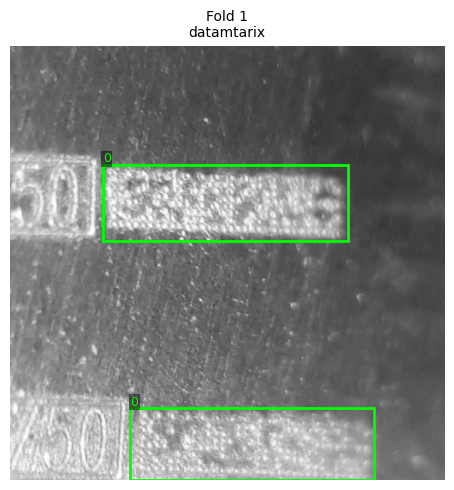

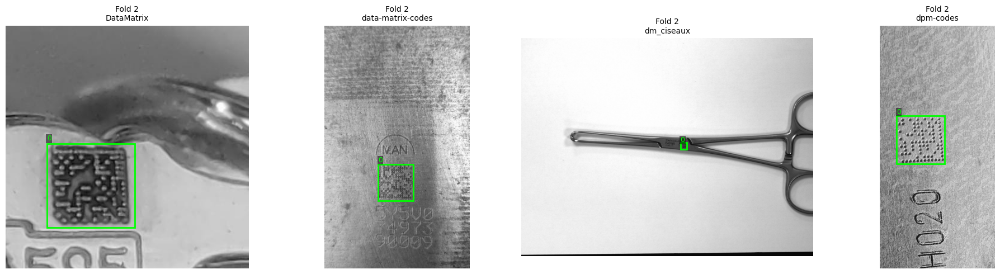

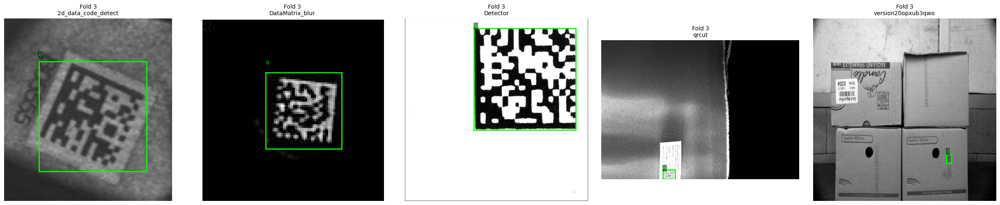

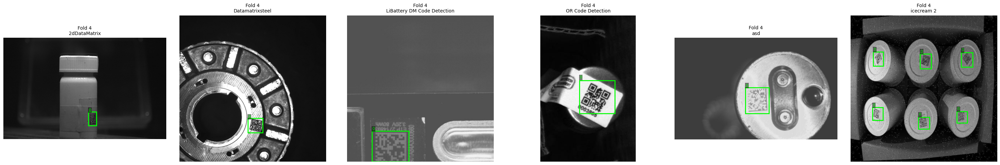

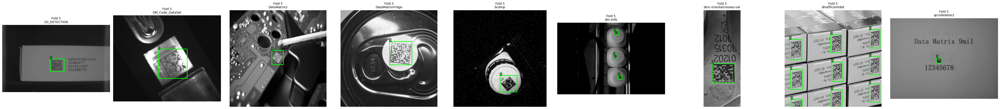

In [25]:
df_folds = styled.data
show_random_examples_per_fold(df_folds)

### Recupere les négatifs dans datasets_background

In [26]:
# ===== Background folds (équilibrage en nb d'images, sans splitter un dataset) =====
import pandas as pd
import numpy as np
from pathlib import Path
from collections import defaultdict
from typing import List, Optional, Union

SRC_BG = Path("../datasets_background")
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _list_images(root: Path) -> list[Path]:
    return [p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]

def build_bg_stats() -> pd.DataFrame:
    rows = []
    if not SRC_BG.exists():
        print(f"⚠️ {SRC_BG} introuvable.")
        return pd.DataFrame(columns=["Dataset","Images","Total BBox","BBox/img (avg)","BBox/img (min)","BBox/img (max)"])
    for ds in sorted([p for p in SRC_BG.iterdir() if p.is_dir()]):
        imgs = _list_images(ds)
        n = len(imgs)
        if n == 0:
            continue
        rows.append({
            "Dataset": ds.name,
            "Images": n,
            "Total BBox": 0,
            "BBox/img (avg)": 0.0,
            "BBox/img (min)": 0,
            "BBox/img (max)": 0,
        })
    return pd.DataFrame(rows).sort_values("Dataset").reset_index(drop=True)

def _create_bg_folds_equilibrated(df_stats: pd.DataFrame, K: int, exclude: Optional[List[str]], randomize: bool, seed: int):
    """Répartition greedy par nombre d'images, sans splitter les datasets (pré-étape avant sampling)."""
    if exclude is None:
        exclude = []
    work = df_stats[~df_stats["Dataset"].isin(exclude)].copy()
    if work.empty:
        return pd.DataFrame(columns=["Fold","Dataset","Images","Total BBox","BBox/img (avg)","BBox/img (min)","BBox/img (max)"])
    if randomize:
        work = work.sample(frac=1.0, random_state=seed).reset_index(drop=True)
    work = work.sort_values("Images", ascending=False).reset_index(drop=True)

    folds = defaultdict(list)
    loads = np.zeros(K, dtype=float)
    for _, row in work.iterrows():
        idx = int(np.argmin(loads))
        folds[idx].append(row["Dataset"])
        loads[idx] += float(row["Images"])

    all_rows = []
    for i in range(K):
        fold_id = f"Fold {i+1}"
        ds_list = folds[i]
        fold_df = df_stats[df_stats["Dataset"].isin(ds_list)].copy()
        if not fold_df.empty:
            fold_df.insert(0, "Fold", fold_id)
            all_rows.append(fold_df)
            total_row = {
                "Fold": fold_id, "Dataset": "TOTAL",
                "Images": int(fold_df["Images"].sum()),
                "Total BBox": 0, "BBox/img (avg)": 0.0, "BBox/img (min)": None, "BBox/img (max)": None
            }
            all_rows.append(pd.DataFrame([total_row]))
        else:
            all_rows.append(pd.DataFrame([{
                "Fold": fold_id, "Dataset": "TOTAL",
                "Images": 0, "Total BBox": 0, "BBox/img (avg)": 0.0,
                "BBox/img (min)": None, "BBox/img (max)": None
            }]))
    df = pd.concat(all_rows, ignore_index=True)
    df["__order__"] = df["Dataset"].ne("TOTAL").astype(int)
    return df.sort_values(by=["Fold","__order__","Dataset"]).drop(columns="__order__")

def _hamilton_round(quotas: Dict[str, float], target_total: int) -> Dict[str, int]:
    """
    Arrondi par plus fortes décimales (méthode de Hamilton) pour que la somme atteigne exactement target_total.
    quotas: dict name -> nombre réel (proportionnel)
    """
    base = {k: int(np.floor(v)) for k, v in quotas.items()}
    assigned = sum(base.values())
    remainders = sorted([(k, quotas[k] - base[k]) for k in quotas], key=lambda x: x[1], reverse=True)
    i = 0
    while assigned < target_total and i < len(remainders):
        base[remainders[i][0]] += 1
        assigned += 1
        i += 1
    # si overshoot (ne devrait pas arriver), on retire aux plus petites décimales
    if assigned > target_total:
        remainders_rev = sorted([(k, quotas[k] - (base[k]-1)) for k in quotas], key=lambda x: x[1])
        j = 0
        while assigned > target_total and j < len(remainders_rev):
            if base[remainders_rev[j][0]] > 0:
                base[remainders_rev[j][0]] -= 1
                assigned -= 1
            j += 1
    return base

def create_bg_folds_with_quota(
    K: int = 5,
    MAX_IMAGES_PER_FOLD: Optional[int] = None,
    exclude: Optional[List[str]] = None,
    randomize: bool = True,
    seed: int = 42,
    copy_selected: bool = False,
    out_root: Union[str, Path] = "datasets_background_selected"
):
    """
    1) Répartit les datasets background en K folds équilibrés (#images), SANS split.
    2) Si MAX_IMAGES_PER_FOLD est défini et qu'un fold dépasse, on sélectionne au plus ce quota :
       - Inclure 100% des datasets "petits" (<25% du fold).
       - Répartir le reste proportionnellement entre les "gros" (≥25%) avec arrondi Hamilton.
    3) Optionnellement, copie la sélection dans out_root/Fold X/<dataset>/images/.
    Retourne: df_bg_stats, df_bg_folds (pré-quota), df_alloc (allocations), df_fold_summary.
    """
    df_bg_stats = build_bg_stats()
    if df_bg_stats.empty:
        print("ℹ️ Aucun dataset background trouvé.")
        return df_bg_stats, pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    df_bg_folds = _create_bg_folds_equilibrated(df_bg_stats, K, exclude, randomize, seed)

    # Construire mapping dataset->liste d'images (pour sampling)
    ds_images: Dict[str, List[Path]] = {}
    rng = random.Random(seed)
    for ds_name in df_bg_stats["Dataset"]:
        paths = _list_images(SRC_BG / ds_name)
        rng.shuffle(paths)  # ordre aléatoire reproductible
        ds_images[ds_name] = paths

    alloc_rows = []
    for fold in sorted(df_bg_folds["Fold"].unique()):
        fold_df = df_bg_folds[(df_bg_folds["Fold"] == fold) & (df_bg_folds["Dataset"] != "TOTAL")]
        if fold_df.empty:
            continue
        sizes = {row["Dataset"]: int(row["Images"]) for _, row in fold_df.iterrows()}
        fold_total = sum(sizes.values())

        # Cas simple: pas de quota ou quota >= total -> tout prend 100%
        if not MAX_IMAGES_PER_FOLD or MAX_IMAGES_PER_FOLD >= fold_total:
            for ds, n in sizes.items():
                sel = ds_images[ds][:n]
                alloc_rows.append({
                    "Fold": fold, "Dataset": ds,
                    "orig_images": n, "is_small": (n / fold_total < 0.25 if fold_total > 0 else True),
                    "allocated": n, "selected_paths": sel
                })
            continue

        # Sinon: appliquer la règle petit/gros + hamilton
        small = {ds: n for ds, n in sizes.items() if n / fold_total < 0.25}
        large = {ds: n for ds, n in sizes.items() if ds not in small}

        small_sum = sum(small.values())
        remaining_quota = MAX_IMAGES_PER_FOLD - small_sum

        # Si les petits dépassent déjà le quota, on garde tout petit et 0 pour les gros (et on informe)
        if remaining_quota <= 0:
            for ds, n in sizes.items():
                take = n if ds in small else 0
                sel = ds_images[ds][:take]
                alloc_rows.append({
                    "Fold": fold, "Dataset": ds,
                    "orig_images": n, "is_small": (ds in small),
                    "allocated": take, "selected_paths": sel
                })
            # (note : sum allocated peut dépasser MAX si petits > MAX; c'est voulu selon ta règle)
            continue

        # Répartition proportionnelle des gros
        large_sum = sum(large.values())
        if large_sum == 0:
            # pas de gros -> tout petit, déjà géré
            for ds, n in sizes.items():
                sel = ds_images[ds][:n]
                alloc_rows.append({
                    "Fold": fold, "Dataset": ds,
                    "orig_images": n, "is_small": True,
                    "allocated": n, "selected_paths": sel
                })
            continue

        quotas = {ds: remaining_quota * (n / large_sum) for ds, n in large.items()}
        alloc_large = _hamilton_round(quotas, remaining_quota)

        # Enregistrer allocations finales (petits = tout, gros = quota)
        for ds, n in sizes.items():
            if ds in small:
                take = n
            else:
                take = min(n, alloc_large.get(ds, 0))
            sel = ds_images[ds][:take]
            alloc_rows.append({
                "Fold": fold, "Dataset": ds,
                "orig_images": n, "is_small": (ds in small),
                "allocated": take, "selected_paths": sel
            })

    df_alloc = pd.DataFrame(alloc_rows)
    if df_alloc.empty:
        print("ℹ️ Allocation vide.")
        return df_bg_stats, df_bg_folds, df_alloc, pd.DataFrame()

    # Résumé avant/après par fold
    fold_before = df_bg_folds[df_bg_folds["Dataset"] == "TOTAL"][["Fold","Images"]].rename(columns={"Images":"Images_before"})
    fold_after = df_alloc.groupby("Fold", as_index=False)["allocated"].sum().rename(columns={"allocated":"Images_after"})
    df_fold_summary = fold_before.merge(fold_after, on="Fold", how="left").fillna(0)
    if MAX_IMAGES_PER_FOLD:
        df_fold_summary["Target"] = MAX_IMAGES_PER_FOLD
    # Optionnel: copie
    if copy_selected:
        out_root = Path(out_root)
        for _, row in df_alloc.iterrows():
            fold = row["Fold"]
            ds = row["Dataset"]
            sel_paths: List[Path] = row["selected_paths"]
            if not sel_paths:
                continue
            tgt_dir = out_root / fold / ds / "images"
            tgt_dir.mkdir(parents=True, exist_ok=True)
            # copier en gardant le nom; si collision improbable, on préfixera
            seen = set()
            for p in sel_paths:
                dst = tgt_dir / p.name
                # éviter collision au sein d'un même ds (très rare)
                if dst.exists() or dst.name in seen:
                    dst = tgt_dir / f"{p.stem}_dup{len(seen)}{p.suffix}"
                shutil.copy2(p, dst)
                seen.add(dst.name)
        print(f"📦 Copie effectuée dans: {out_root}")

    # Nettoyage des colonnes pour l'affichage (ne pas montrer les chemins par défaut)
    df_alloc_view = df_alloc.drop(columns=["selected_paths"]).sort_values(["Fold","Dataset"]).reset_index(drop=True)

    print("✅ Allocation faite. Résumé par fold (avant → après):")
    display(df_fold_summary)

    return df_bg_stats, df_bg_folds, df_alloc_view, df_fold_summary

In [27]:
# Paramètres
K = 5
MAX_IMAGES_PER_FOLD = 1000          # quota cible par fold
exclude_bg = []                      # ex: ["bg_bad_dump"]

df_bg_stats, df_bg_folds, df_alloc, df_fold_summary = create_bg_folds_with_quota(
    K=K,
    MAX_IMAGES_PER_FOLD=MAX_IMAGES_PER_FOLD,
    exclude=exclude_bg,
    randomize=True,
    seed=42,
    copy_selected=False,             # passe à True pour copier la sélection
    out_root="datasets_background_selected"
)

# df_alloc contient, par (Fold, Dataset), le nb initial et le nb alloué (avec flag is_small)
display(df_alloc)



✅ Allocation faite. Résumé par fold (avant → après):


,Fold,Images_before,Images_after,Target
0,Fold 1,2506,1000,1000
1,Fold 2,2587,1000,1000
2,Fold 3,2483,1000,1000
3,Fold 4,2519,1000,1000
4,Fold 5,2465,1000,1000


,Fold,Dataset,orig_images,is_small,allocated
0,Fold 1,Rings detect one,251,True,251
1,Fold 1,TM,2123,False,617
2,Fold 1,box-count-load-one-level,132,True,132
3,Fold 2,direct,1922,False,743
4,Fold 2,engine-fault1,665,False,257
5,Fold 3,Spatters,679,False,273
6,Fold 3,cushion-h,1804,False,727
7,Fold 4,el-data_12folders-1st-time,818,False,325
8,Fold 4,object,760,False,302
9,Fold 4,panneau ph,941,False,373


# 3. Créer les fold et le dataset final

In [45]:
# Fusion des folds annotés + backgrounds en copiant les fichiers
# Sortie: datasets_merged_into_folds/Fold X/{images,labels} avec prefix foldX_
from pathlib import Path
from typing import Optional, List, Tuple, Dict, Union
import shutil
import random
import pandas as pd

# Dossiers sources
CLEAN_ROOT = Path("../datasets_clean")
BG_ROOT    = Path("../datasets_background")
# Dossier destination (sera supprimé puis recréé)
OUT_ROOT   = Path("../dataset_folds_distinct")

IMG_DIR_CANDIDATES   = ["grayscale_dataset", "images"]
LABEL_DIR_CANDIDATES = [ "labels_distinct","labels_unified", "labels_aabb", "labels"]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _find_first_dir(root: Path, names: List[str]) -> Optional[Path]:
    for n in names:
        p = root / n
        if p.exists() and p.is_dir():
            return p
    return None

def _list_images(root: Path):
    return [p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]

def _safe_copy(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(src, dst)

def _save_grayscale(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    img = Image.open(src).convert("L")   # "L" = grayscale
    img.save(dst)

def _write_empty_label(dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    if not dst.exists():
        dst.write_text("", encoding="utf-8")

def _prefixed_name(fold_prefix: str, src_name: str) -> str:
    return f"{fold_prefix}{src_name}"

def _resolve_collision(dst_dir: Path, filename: str, dataset_name: str) -> Path:
    p = dst_dir / filename
    if not p.exists():
        return p
    stem, suffix = Path(filename).stem, Path(filename).suffix
    candidate = dst_dir / f"{stem}_{dataset_name}{suffix}"
    if not candidate.exists():
        return candidate
    n = 1
    while True:
        candidate = dst_dir / f"{stem}_{dataset_name}_dup{n}{suffix}"
        if not candidate.exists():
            return candidate
        n += 1

def merge_copy_into_single_dirs(
    df_folds_annot: pd.DataFrame,
    df_alloc_bg: pd.DataFrame,
    seed: int = 42,
    delete_out_if_exists: bool = True,
    prefer_grayscale: bool = True
):
    """
    Copie:
      - toutes les images + labels des datasets annotés par fold,
      - un échantillon aléatoire d'images de background selon df_alloc_bg.allocated,
        en les convertissant en grayscale,
    dans:
      datasets_merged_into_folds/images
      datasets_merged_into_folds/labels
    avec préfixe 'foldX_' pour TOUS les fichiers.
    """
    rng = random.Random(seed)

    if hasattr(df_folds_annot, "data"):
        df_folds_annot = df_folds_annot.data
    if hasattr(df_alloc_bg, "data"):
        df_alloc_bg = df_alloc_bg.data

    if OUT_ROOT.exists() and delete_out_if_exists:
        shutil.rmtree(OUT_ROOT)
    out_img = OUT_ROOT / "images"
    out_lbl = OUT_ROOT / "labels"
    out_img.mkdir(parents=True, exist_ok=True)
    out_lbl.mkdir(parents=True, exist_ok=True)

    annot_df = df_folds_annot[df_folds_annot["Dataset"] != "TOTAL"].copy()
    bg_alloc = df_alloc_bg.copy()
    if "allocated" not in bg_alloc.columns:
        raise ValueError("df_alloc_bg doit contenir la colonne 'allocated'.")

    summary = []
    for fold in sorted(annot_df["Fold"].unique()):
        fold_prefix = f"{fold.lower().replace(' ', '')}_"  
        copied_annot, copied_bg = 0, 0

        # Annotés
        ds_list = annot_df[annot_df["Fold"] == fold]["Dataset"].tolist()
        for ds_name in ds_list:
            ds_root = CLEAN_ROOT / ds_name
            if not ds_root.exists():
                continue
            img_dirs = IMG_DIR_CANDIDATES if prefer_grayscale else list(reversed(IMG_DIR_CANDIDATES))
            img_dir = _find_first_dir(ds_root, img_dirs)
            if img_dir is None:
                continue
            lbl_dir = _find_first_dir(ds_root, LABEL_DIR_CANDIDATES)
            for ip in _list_images(img_dir):
                base_name = _prefixed_name(fold_prefix, ip.name)
                dst_img = _resolve_collision(out_img, base_name, ds_name)
                _safe_copy(ip, dst_img)
                lbl_src = (lbl_dir / f"{ip.stem}.txt") if lbl_dir else None
                dst_lbl = out_lbl / f"{dst_img.stem}.txt"
                if lbl_src and lbl_src.exists():
                    _safe_copy(lbl_src, dst_lbl)
                else:
                    _write_empty_label(dst_lbl)
                copied_annot += 1

        # Backgrounds
        fold_bg = bg_alloc[(bg_alloc["Fold"] == fold) & (bg_alloc["allocated"] > 0)]
        for _, row in fold_bg.iterrows():
            ds_name = row["Dataset"]
            k = int(row["allocated"])
            ds_root = BG_ROOT / ds_name
            if not ds_root.exists() or k <= 0:
                continue
            candidates = _list_images(ds_root)
            if not candidates:
                continue
            rng.shuffle(candidates)
            pick = candidates[:min(k, len(candidates))]
            for ip in pick:
                base_name = _prefixed_name(fold_prefix, ip.name)
                dst_img = _resolve_collision(out_img, base_name, ds_name)
                _save_grayscale(ip, dst_img)  # ✅ convertit en grayscale
                dst_lbl = out_lbl / f"{dst_img.stem}.txt"
                _write_empty_label(dst_lbl)
                copied_bg += 1

        summary.append({
            "Fold": fold,
            "annot_images_copied": copied_annot,
            "bg_images_copied": copied_bg,
            "total_images_copied": copied_annot + copied_bg
        })

    summary_df = pd.DataFrame(summary).sort_values("Fold").reset_index(drop=True)
    print(f"✅ Copie terminée → {OUT_ROOT} (backgrounds convertis en grayscale)")
    display(summary_df)
    return summary_df

In [46]:
# Si tu as un Styler pour les folds annotés :
# df_folds_annot = styled_annot.data

# df_alloc vient de create_bg_folds_with_quota(...), il contient 'Fold', 'Dataset', 'allocated'
summary = merge_copy_into_single_dirs(
    df_folds_annot=df_folds,
    df_alloc_bg=df_alloc,
    seed=42,
    delete_out_if_exists=True,   # supprime le dossier à chaque run
    prefer_grayscale=True        # prend grayscale_dataset si dispo, sinon images/
)

✅ Copie terminée → ../dataset_folds_distinct (backgrounds convertis en grayscale)


,Fold,annot_images_copied,bg_images_copied,total_images_copied
0,Fold 1,4643,1000,5643
1,Fold 2,3758,1000,4758
2,Fold 3,3799,1000,4799
3,Fold 4,3403,1000,4403
4,Fold 5,2794,1000,3794


# Creer le test set

In [44]:
from pathlib import Path
import shutil

SRC_ROOT = Path("../datasets_clean")
DST_ROOT = Path("../dataset_test")

DATASETS = [
    "20240517", 
    "recntagledmtest", 
    "dm-and-qr-detection", 
    "dmcode", 
    "real_2dcodes", 
    "datamatrix_140",
    "datamatrixfit", 
    "implementacao", 
    "pcb_dataset-eislu"
]

IMG_DIR_CANDIDATES   = ["grayscale_dataset", "images"]
LABEL_DIR_CANDIDATES = ["labels_distinct","labels_unified",  "labels_aabb", "labels"]
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _find_first_dir(root: Path, candidates):
    for c in candidates:
        d = root / c
        if d.exists() and d.is_dir():
            return d
    return None

def _list_images(root: Path):
    return [p for p in root.rglob("*") if p.is_file() and p.suffix.lower() in IMG_EXTS]

def _safe_copy(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(src, dst)

def _resolve_collision(dst_dir: Path, filename: str, dataset_name: str) -> Path:
    """Renomme en cas de collisions"""
    p = dst_dir / filename
    if not p.exists():
        return p
    stem, suffix = Path(filename).stem, Path(filename).suffix
    candidate = dst_dir / f"{stem}_{dataset_name}{suffix}"
    if not candidate.exists():
        return candidate
    n = 1
    while True:
        candidate = dst_dir / f"{stem}_{dataset_name}_dup{n}{suffix}"
        if not candidate.exists():
            return candidate
        n += 1

# Nettoyer le dossier test
if DST_ROOT.exists():
    shutil.rmtree(DST_ROOT)
(DST_ROOT / "images").mkdir(parents=True, exist_ok=True)
(DST_ROOT / "labels").mkdir(parents=True, exist_ok=True)

n_img, n_lbl = 0, 0

for ds in DATASETS:
    ds_root = SRC_ROOT / ds
    if not ds_root.exists():
        print(f"⚠️ Dataset introuvable: {ds}")
        continue

    img_dir = _find_first_dir(ds_root, IMG_DIR_CANDIDATES)
    lbl_dir = _find_first_dir(ds_root, LABEL_DIR_CANDIDATES)

    if not img_dir:
        print(f"⚠️ Pas d'images trouvées dans {ds}")
        continue

    for ip in _list_images(img_dir):
        dst_img = _resolve_collision(DST_ROOT / "images", ip.name, ds)
        _safe_copy(ip, dst_img)
        n_img += 1

        if lbl_dir:
            lbl_src = lbl_dir / f"{ip.stem}.txt"
            if lbl_src.exists():
                dst_lbl = (DST_ROOT / "labels" / f"{dst_img.stem}.txt")
                _safe_copy(lbl_src, dst_lbl)
                n_lbl += 1

print(f"✅ Fusion terminée → {DST_ROOT}")
print(f"📊 Résumé: {n_img} images copiées | {n_lbl} labels copiés")

✅ Fusion terminée → ../dataset_test
📊 Résumé: 7971 images copiées | 7971 labels copiés
